In [14]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tf_util.systems import system_from_str
from train_dsn import train_dsn

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


w_0 2.23606797749979
zeta 0.22360679774997896


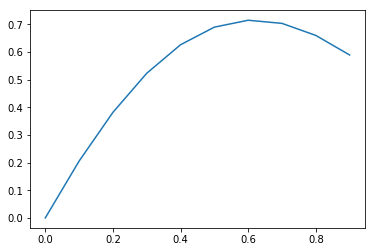

In [15]:
T = 10;
dt = .1;

k = 5.0;
c = 1.0;
m  = 1.0;

bounds = [0.0, 20.0];

w_0 = np.sqrt(k/m);
zeta = c/(2*np.sqrt(m*k));

print('w_0', w_0);
print('zeta', zeta);

A = 1.0;
theta = 0.0;
t = np.linspace(0,dt*(T-1),T);
x = A*np.exp(-(zeta*w_0*t))*np.sin(np.sqrt(1-np.square(zeta))*w_0*t + theta);

dxdt = A*(-zeta*w_0*np.exp(-zeta*w_0*t)*np.sin(np.sqrt(1.0-np.square(zeta))*w_0*t + theta) + \
          np.exp(-zeta*w_0*t)*np.cos(np.sqrt(1-np.square(zeta))*w_0*t + theta)*(np.sqrt(1-np.square(zeta))*w_0));

plt.figure();
plt.plot(t,x);
#plt.plot(t,dxdt);
#plt.legend(['x', 'dxdt']);
plt.show();

init_conds = np.array([0.0, dxdt[0]]);

[0.         0.22222222 0.44444444 0.66666667 0.88888889 1.11111111
 1.33333333 1.55555556 1.77777778 2.        ]


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in double_scalars
  app.launch_new_instance()
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


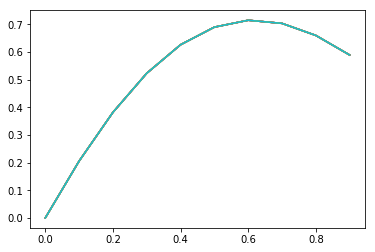

w_0 2.23606797749979
zeta 0.22360679774997896


In [16]:
# show that the degenerate solution space is just a scaling of c, m, and k
num_s = 10;
s = np.linspace(0,2,num_s);
print(s)

ks = [];
cs = [];
ms = [];
plt.figure();
for i in range(num_s):
    s_i = s[i];
    k_i = s_i*k;
    c_i = s_i*c;
    m_i = s_i*m;
    
    w_0 = np.sqrt(k_i/m_i);
    zeta = c_i/(2*np.sqrt(m_i*k_i));

    x_i = A*np.exp(-(zeta*w_0*t))*np.sin(np.sqrt(1-np.square(zeta))*w_0*t + theta);
    
    plt.plot(t, x_i);
    
    ks.append(k_i);
    cs.append(c_i);
    ms.append(m_i);
    
    dxdt = A*(-zeta*w_0*np.exp(-zeta*w_0*t)*np.sin(np.sqrt(1.0-np.square(zeta))*w_0*t + theta) + \
          np.exp(-zeta*w_0*t)*np.cos(np.sqrt(1-np.square(zeta))*w_0*t + theta)*(np.sqrt(1-np.square(zeta))*w_0));

    init_conds = np.array([0.0, dxdt[0]]);
    
plt.show();

print('w_0', w_0);
print('zeta', zeta);


In [17]:
D = 2;
system_str = 'damped_harmonic_oscillator'

behavior_str = 'steady_state';

system_class = system_from_str(system_str);
system = system_class(behavior_str, T, dt, init_conds, bounds);
print(system.name)

damped_harmonic_oscillator


In [18]:
K = 1;
M = num_s;
num_params = 3;
phi = tf.placeholder(dtype=tf.float64, shape=(K, M, num_params, 1));

X = system.simulate(phi);


phi (1, 10, 3, 1)


In [19]:
K = 1;
M = 10;
k_tf = tf.get_variable('k', dtype=tf.float64, shape=(K,M,1));
c_tf = tf.get_variable('c', dtype=tf.float64, shape=(K,M,1));
m_tf = tf.get_variable('m', dtype=tf.float64, shape=(K,M,1));

k_np = np.expand_dims(np.expand_dims(k*np.linspace(0,2,M), 0), 2);
c_np = np.expand_dims(np.expand_dims(c*np.linspace(0,2,M), 0), 2);
m_np = np.expand_dims(np.expand_dims(m*np.linspace(0,2,M), 0), 2);

_phi = np.expand_dims(np.concatenate((k_np, c_np, m_np), axis=2), 3);


In [20]:
def dydt(y, t):
    y1 = y[0];
    y2 = y[1];

    w_0 = tf.sqrt(tf.divide(k_tf,m_tf));
    zeta = tf.divide(c_tf, 2.0*tf.sqrt(tf.multiply(m_tf,k_tf)));
        
    y1_dot = y2;
    y2_dot = -2.0*tf.multiply(tf.multiply(w_0, zeta), y2) - tf.multiply(tf.square(w_0), y1);
    
    print(y1_dot.shape);
    print(y2_dot.shape);
    ydot = tf.stack([y1_dot, y2_dot]);
    return ydot;

y0_np = np.concatenate((init_conds[0]*np.ones((1,K,M,1)), \
                        init_conds[1]*np.ones((1,K,M,1))), axis=0);
y0 = tf.constant(y0_np, dtype=tf.float64);
out = dydt(y0, 0.0)

(1, 10, 1)
(1, 10, 1)


In [21]:
t = np.linspace(0,dt*(T-1), T);
out = tf.contrib.integrate.odeint_fixed(dydt, y0, t, method='rk4');

(1, 10, 1)
(1, 10, 1)
(1, 10, 1)
(1, 10, 1)
(1, 10, 1)
(1, 10, 1)
(1, 10, 1)
(1, 10, 1)


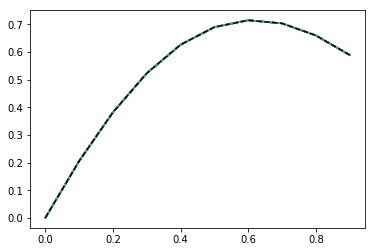

In [22]:
feed_dict_dydt = {c_tf:c_np, k_tf:k_np, m_tf:m_np};
feed_dict_sim = {phi:_phi};
with tf.Session() as sess:
    _out = sess.run(out, feed_dict_dydt);
    _X = sess.run(X, feed_dict_sim)

plt.figure();
for i in range(num_s):
    plt.plot(t, _out[:,0,0,i,0]);
    plt.plot(t, _X[0,i,0,:]);
plt.plot(t, x_i, 'k--');
plt.show();



In [23]:
# behavioral constraints
mu = x
Sigma = .0001*np.ones((T,));

{'mu': array([0.        , 0.20567829, 0.38203797, 0.52351255, 0.62671824,
       0.69040656, 0.71532034, 0.70396894, 0.66034133, 0.58957623]), 'Sigma': array([0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001,
       0.0001, 0.0001])}
[0.         2.17944947]
c_init 1e-10
results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/
0 <tf_util.flows.PlanarFlowLayer object at 0x1417760b8>
1 <tf_util.flows.PlanarFlowLayer object at 0x1417767f0>
2 <tf_util.flows.PlanarFlowLayer object at 0x1417766d8>
3 <tf_util.flows.PlanarFlowLayer object at 0x141776780>
4 <tf_util.flows.PlanarFlowLayer object at 0x1417765c0>
Tensor("Const_10:0", shape=(3, 1), dtype=float64)
Tensor("Const_11:0", shape=(1, 1), dtype=float64)
Tensor("Const_12:0", shape=(3, 1), dtype=float64)
Tensor("Const_13:0", shape=(1, 1), dtype=float64)
Tensor("Const_14:0", shape=(3, 1), dtype=float64)
Tensor("Const_15:0", shape=(1, 1), dtype=float64)
Tensor("Const_16:0", shape=(3, 1), dtype=float64)
Tenso

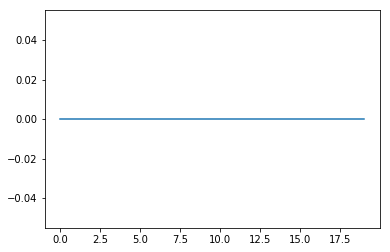

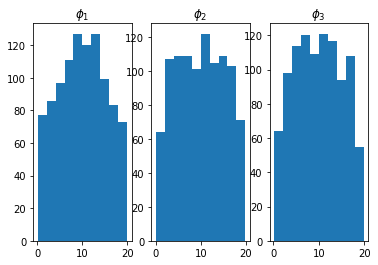

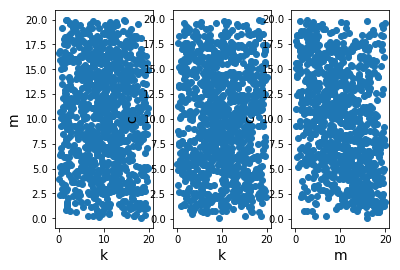

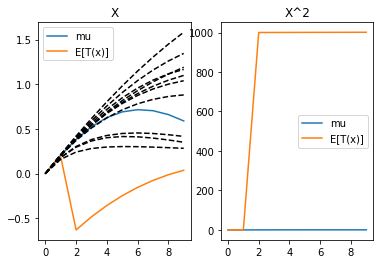

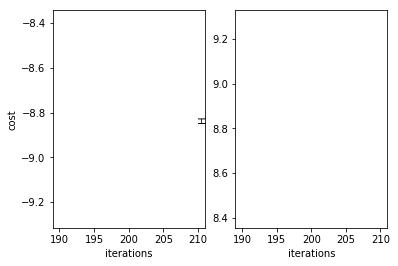

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 400 
H 8.832953656792695
cost -8.820836232949622
system.D 3


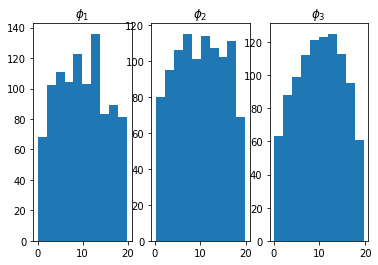

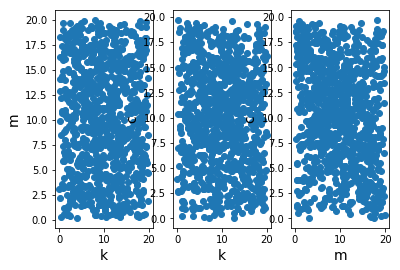

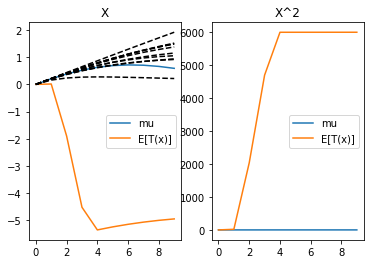

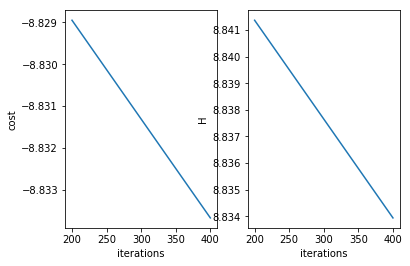

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 600 
H 8.832774046685888
cost -8.827094840084523
system.D 3


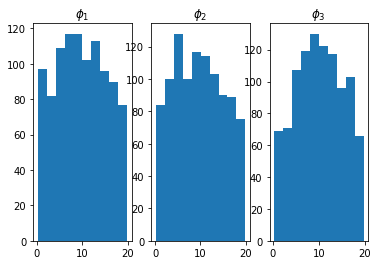

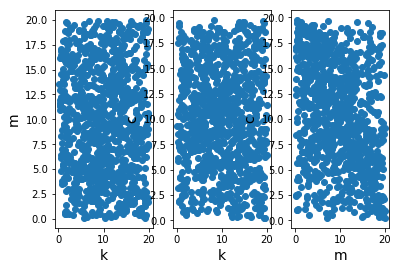

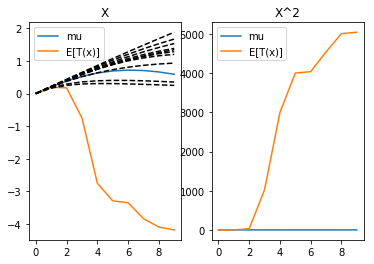

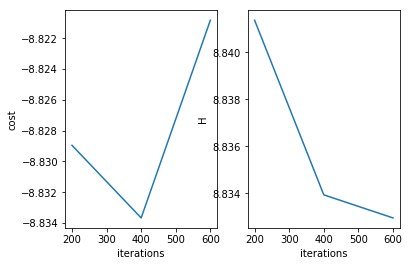

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 800 
H 8.84241678181407
cost -8.842161363907195
system.D 3


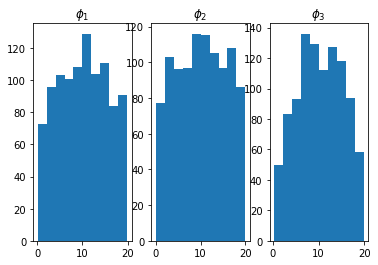

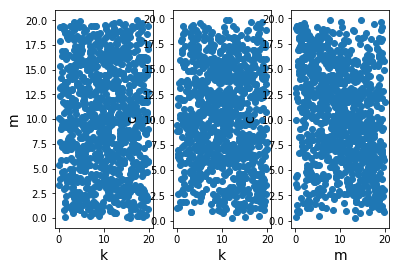

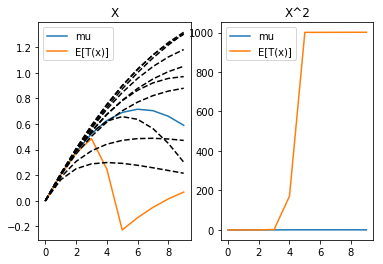

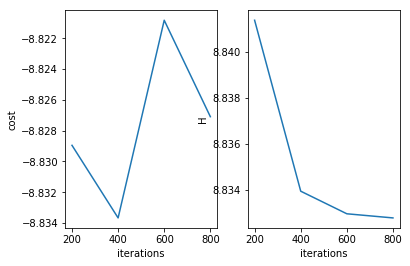

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 1000 
H 8.828966115372229
cost -8.827208561453526
system.D 3


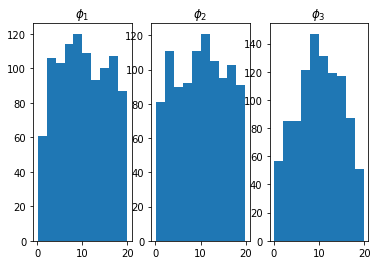

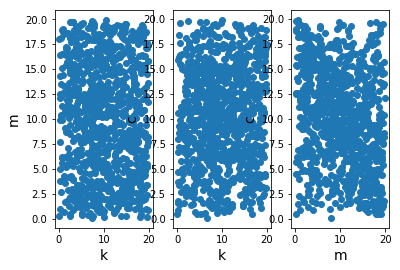

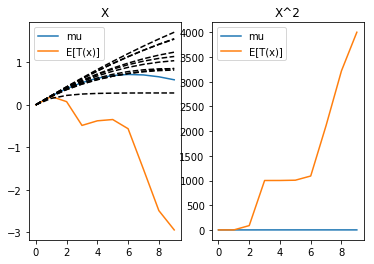

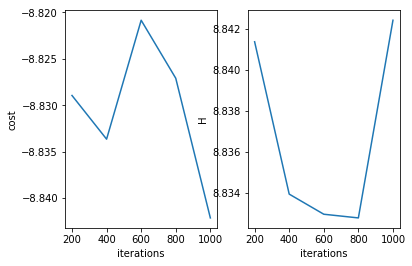

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 1200 
H 8.838106066772426
cost -8.838103416412038
system.D 3


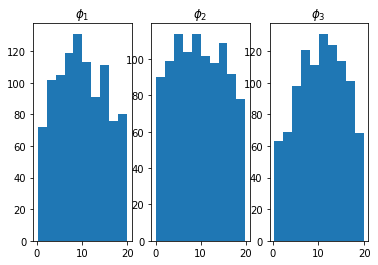

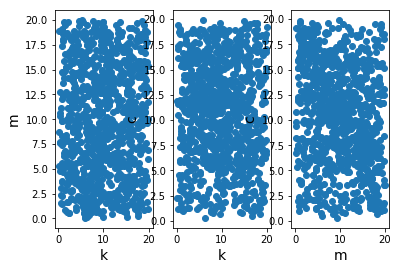

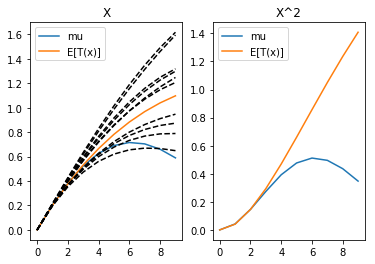

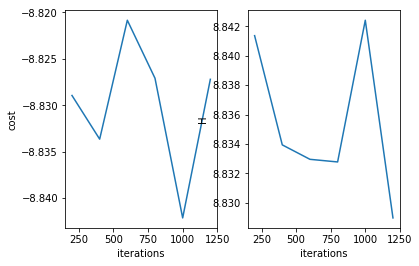

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 1400 
H 8.797084035635988
cost -8.796779729917398
system.D 3


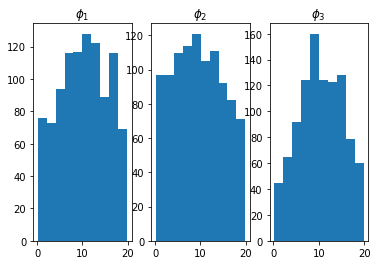

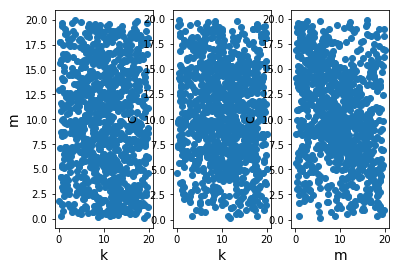

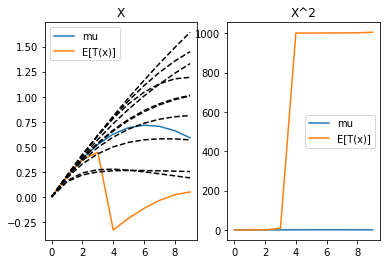

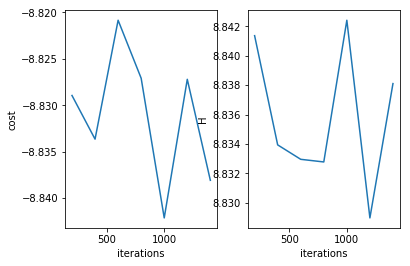

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 1600 
H 8.812121573313043
cost -8.811365466637296
system.D 3


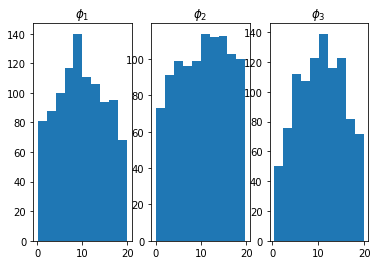

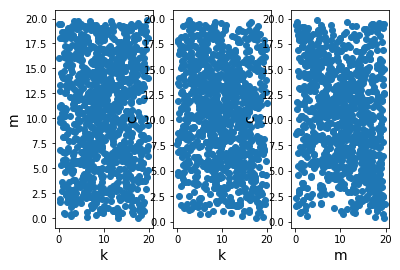

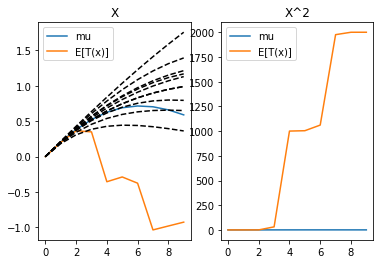

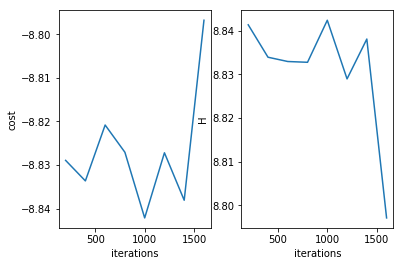

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 1800 
H 8.810864732942916
cost -8.802410003105434
system.D 3


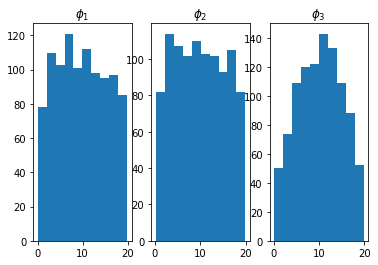

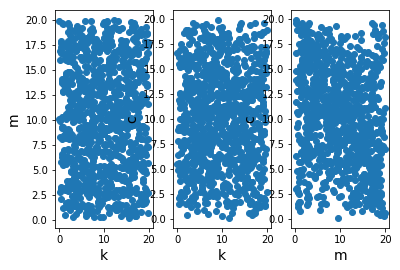

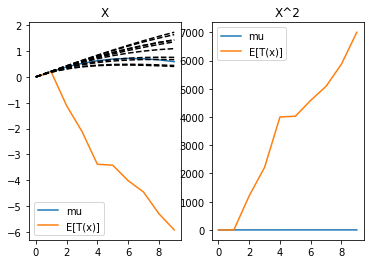

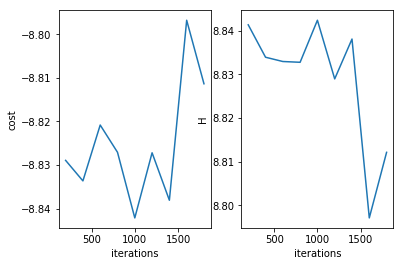

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 2000 
H 8.807767135658102
cost -8.806194814864696
system.D 3


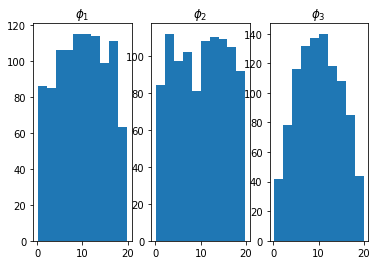

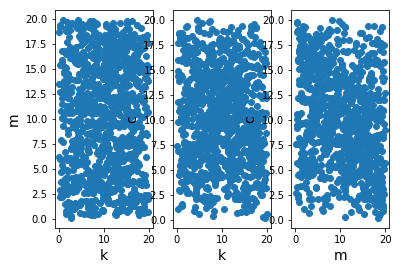

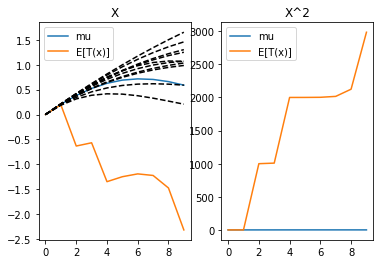

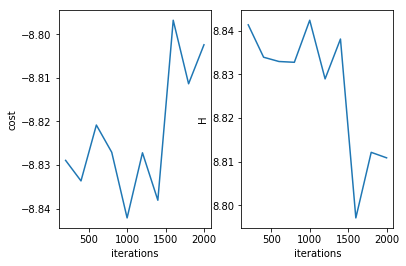

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 2200 
H 8.835853349992739
cost -8.835646039960716
system.D 3


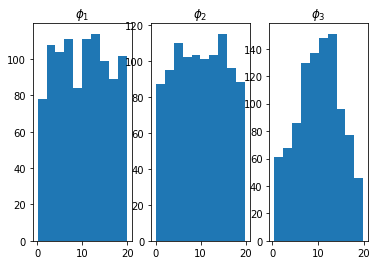

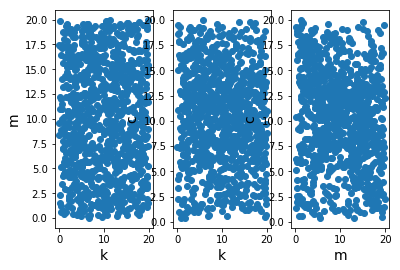

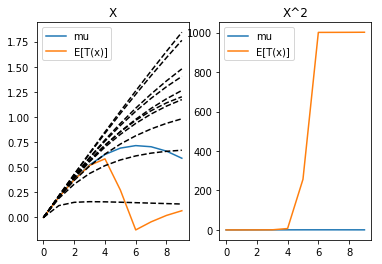

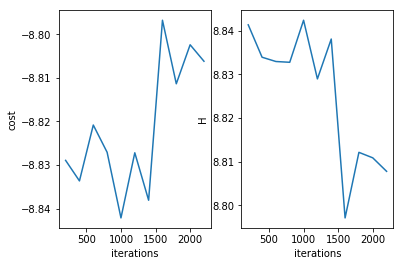

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 2400 
H 8.820614849040918
cost -8.819093794643699
system.D 3


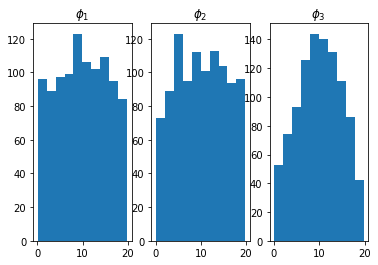

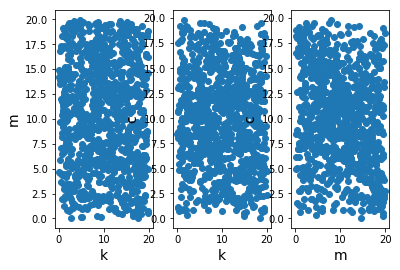

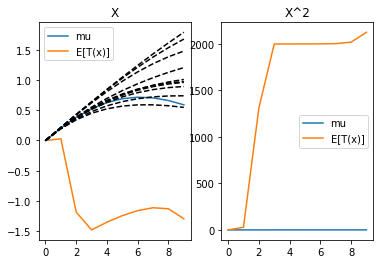

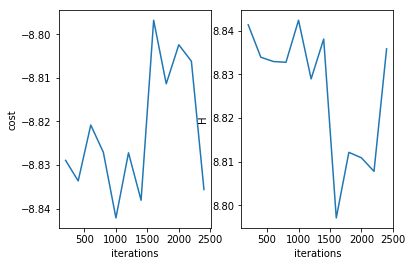

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 2600 
H 8.810530943393408
cost -8.810175587014765
system.D 3


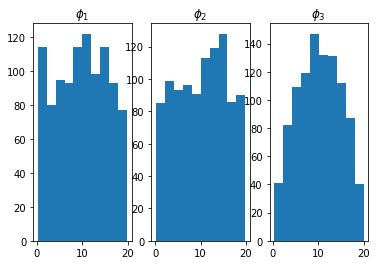

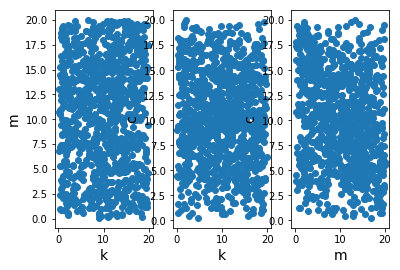

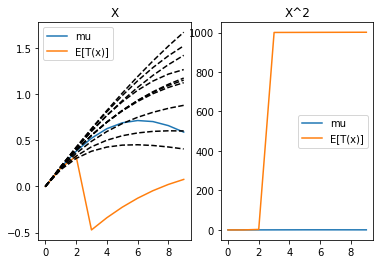

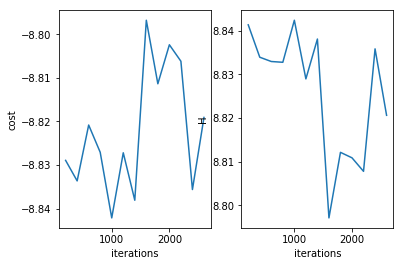

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 2800 
H 8.810125973440067
cost -8.807325640593813
system.D 3


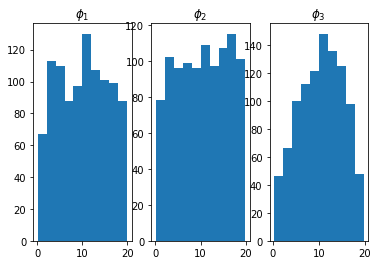

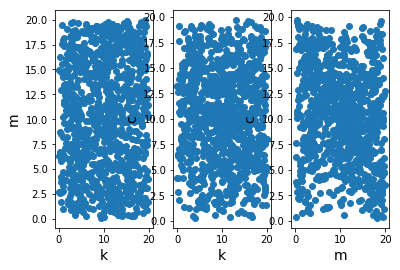

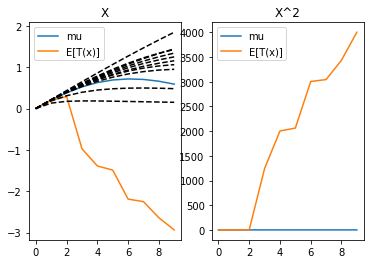

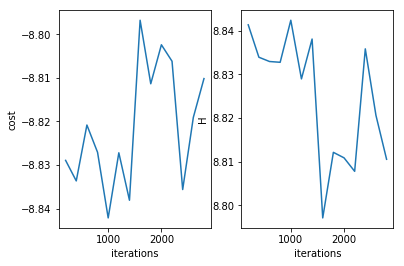

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 3000 
H 8.821902447585911
cost -8.82108972037858
system.D 3


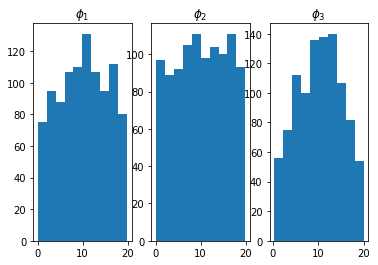

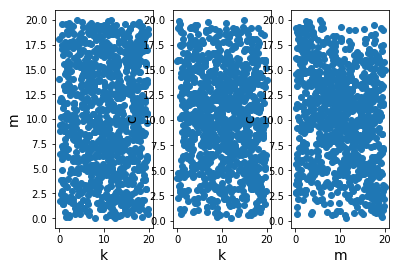

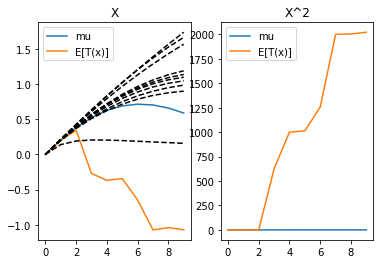

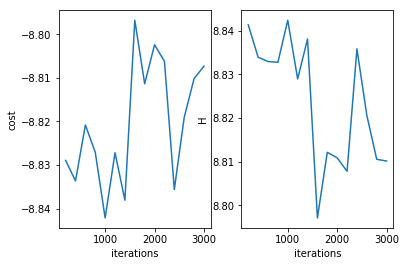

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 3200 
H 8.846429763252548
cost -8.843922965370416
system.D 3


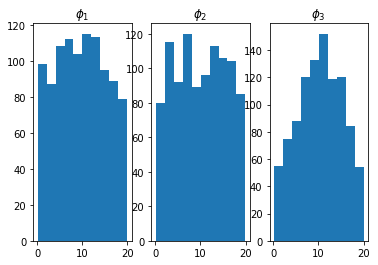

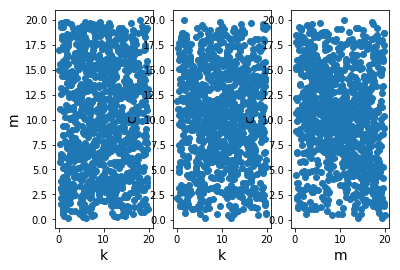

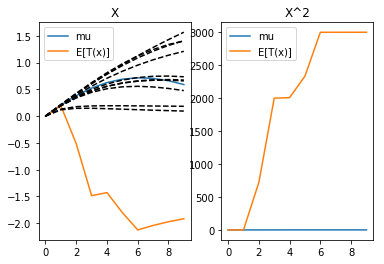

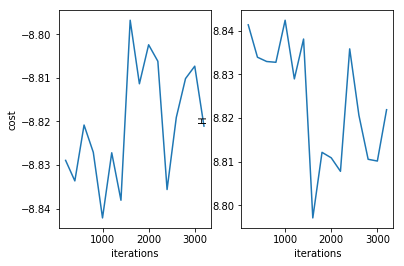

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 3400 
H 8.814256912454093
cost -8.81532850013709
system.D 3


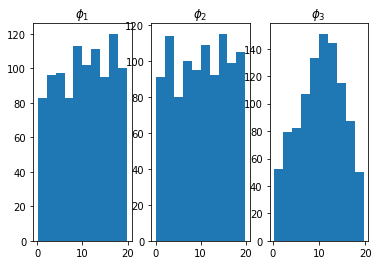

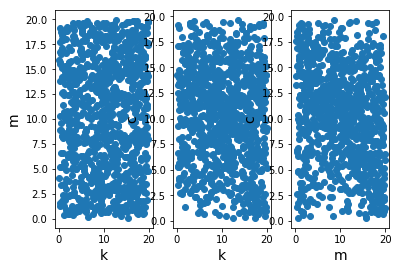

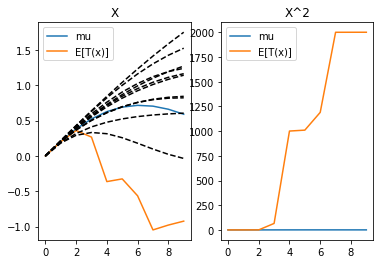

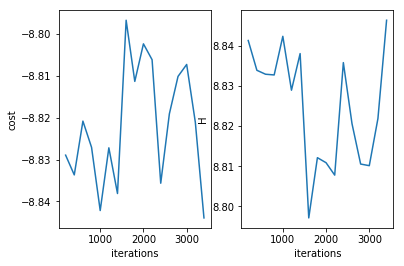

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 3600 
H 8.776241872972234
cost -8.776081233688522
system.D 3


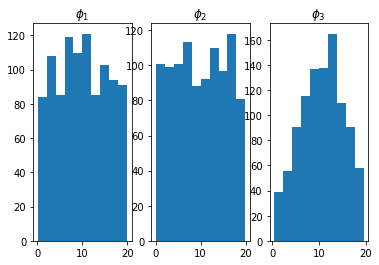

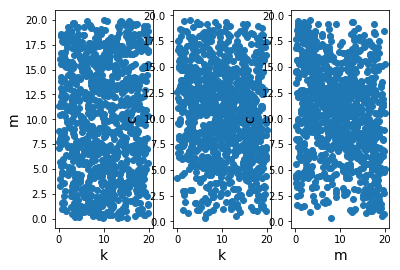

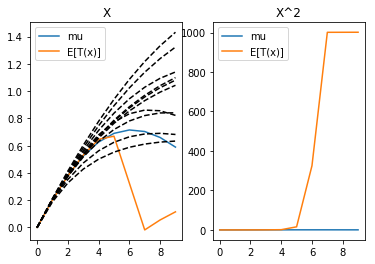

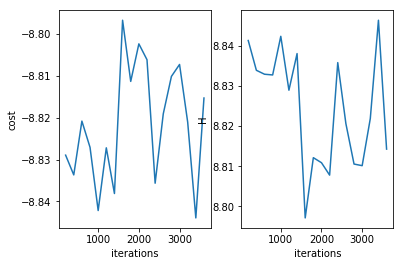

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 3800 
H 8.785532216893408
cost -8.784072293315356
system.D 3


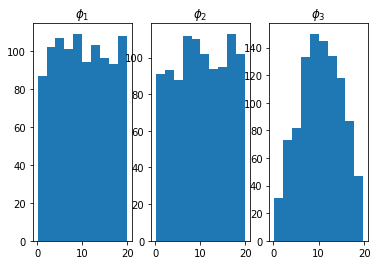

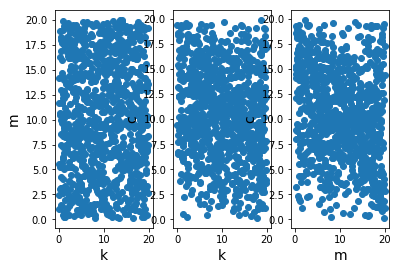

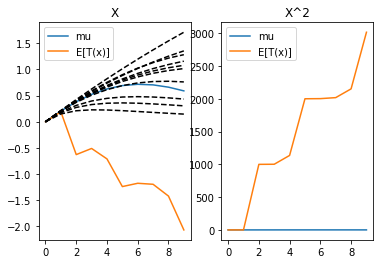

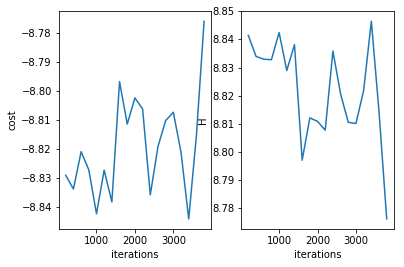

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 4000 
H 8.801389777217187
cost -8.80042833219472
system.D 3


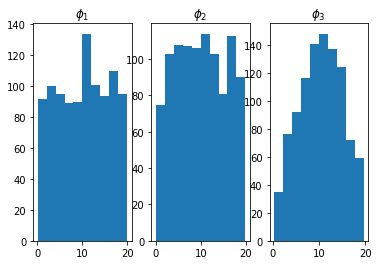

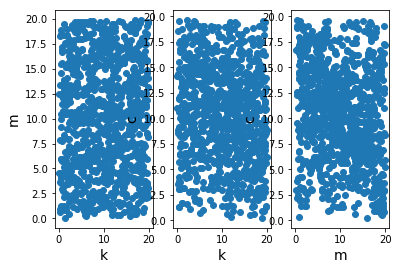

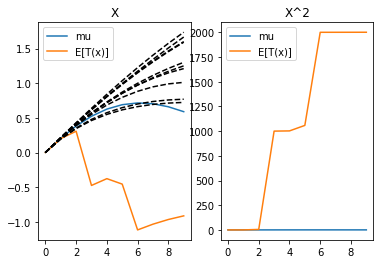

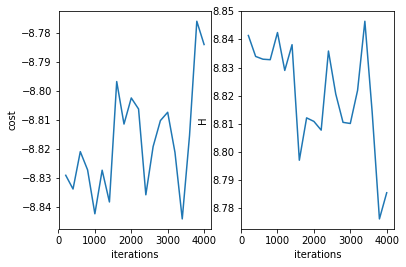

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 4200 
H 8.804123991758429
cost -8.803813975518425
system.D 3


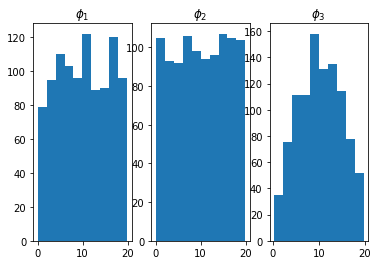

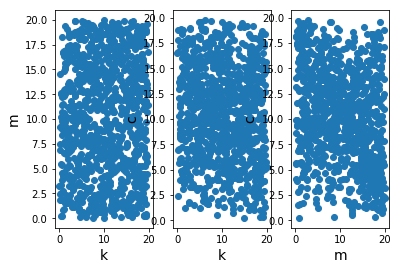

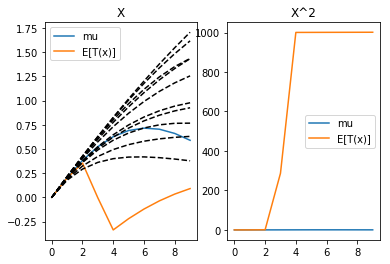

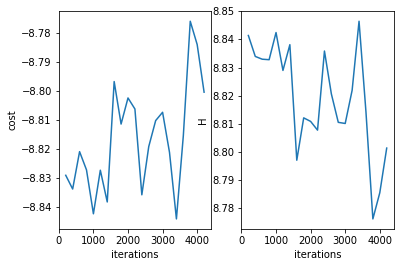

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 4400 
H 8.82050949448275
cost -8.814337857891879
system.D 3


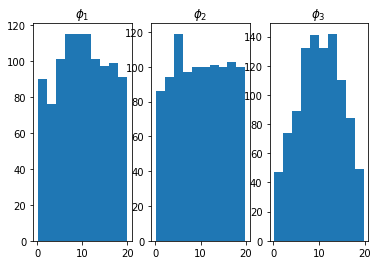

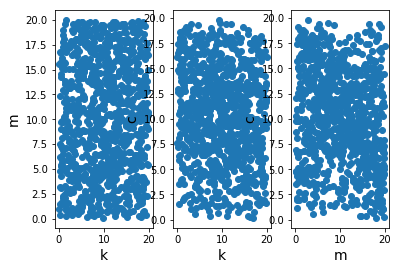

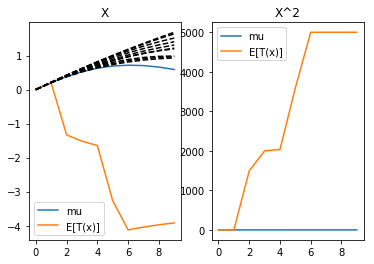

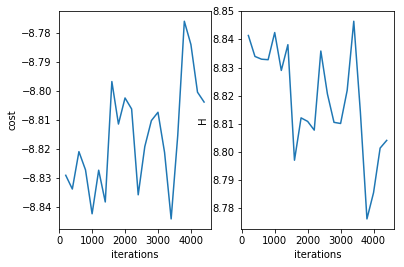

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 4600 
H 8.79202603724295
cost -8.792018538550623
system.D 3


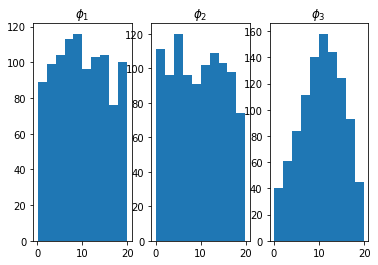

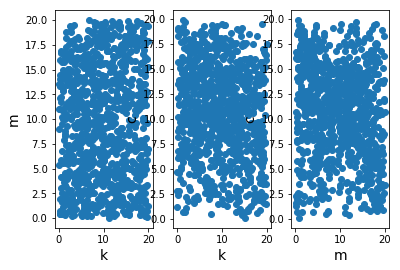

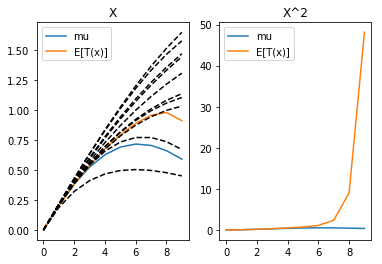

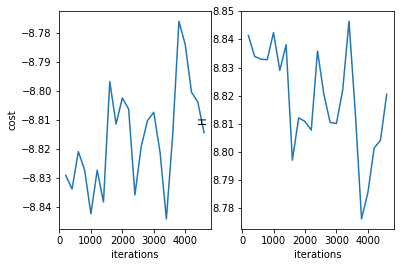

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 4800 
H 8.774030733155334
cost -8.772955182815302
system.D 3


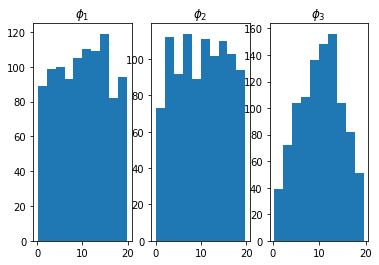

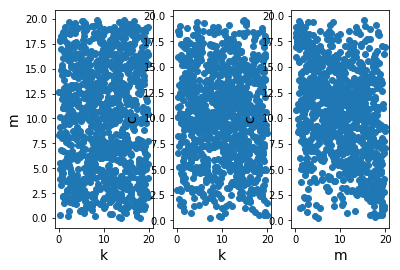

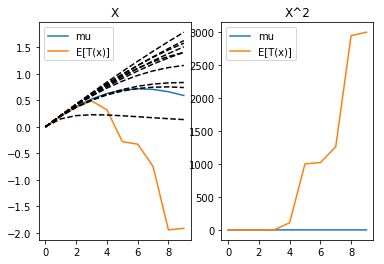

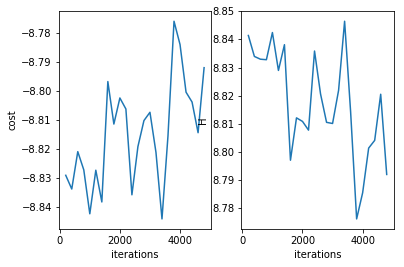

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 5000 
H 8.792899093018185
cost -8.791951162440823
system.D 3


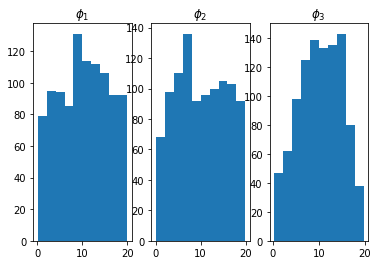

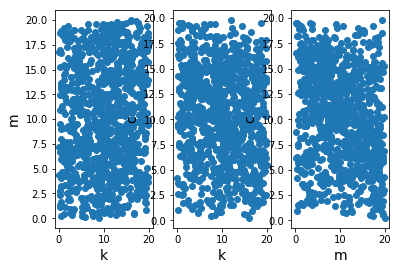

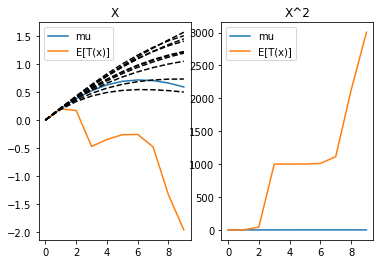

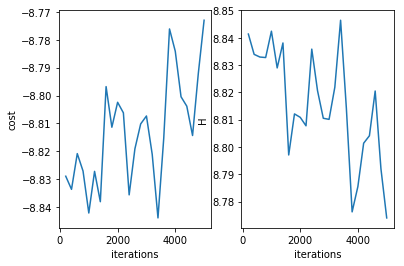

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
******************************************
it = 5200 
H 8.720887250776208
cost -8.719621517913048
system.D 3


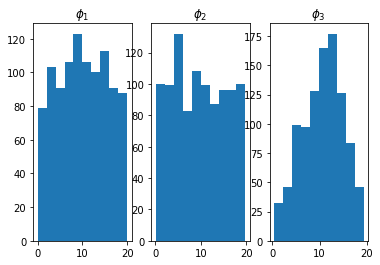

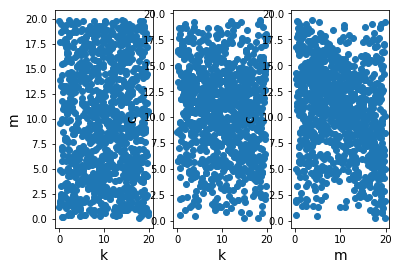

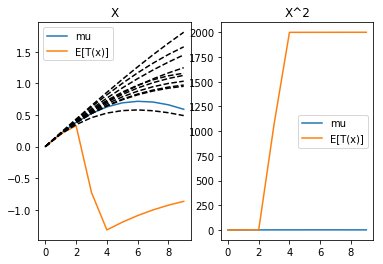

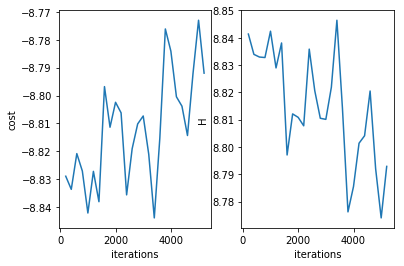

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 5400 
H 8.736694761012023
cost -8.736687209833729
system.D 3


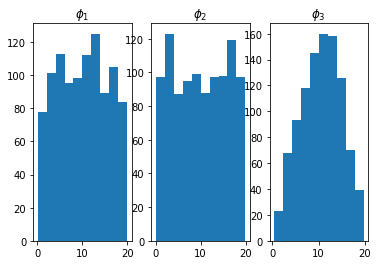

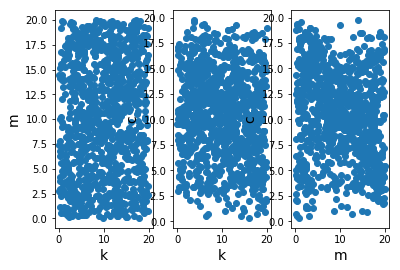

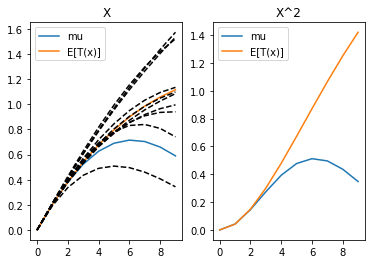

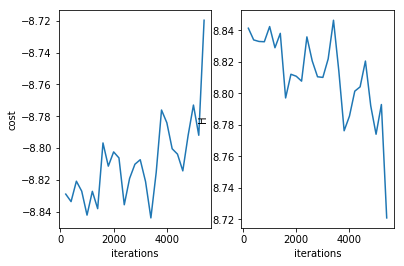

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 5600 
H 8.745410446757687
cost -8.74540262564256
system.D 3


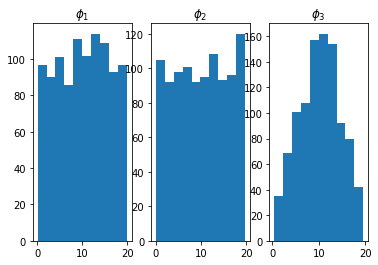

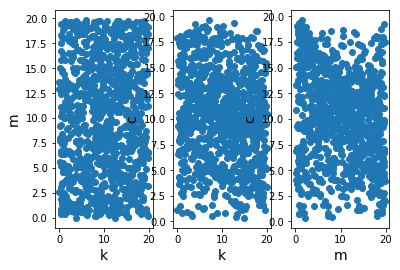

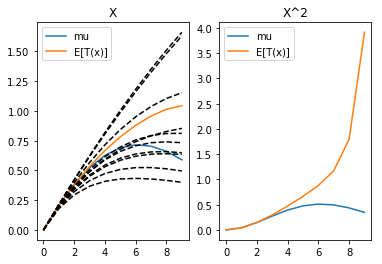

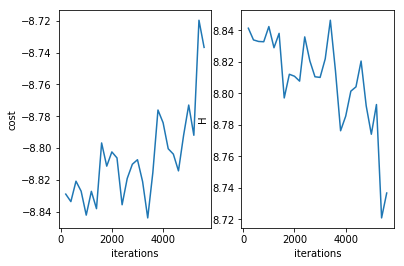

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 5800 
H 8.725333578136837
cost -8.724923001696117
system.D 3


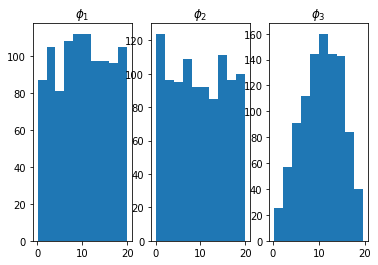

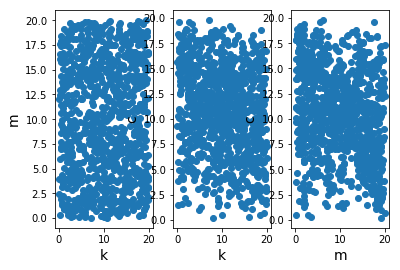

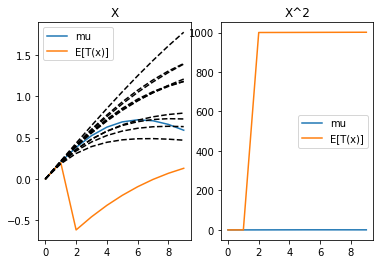

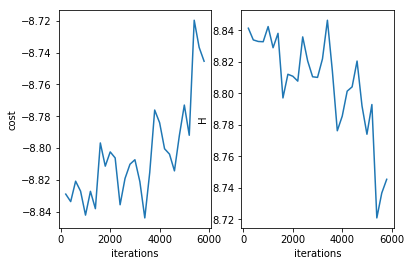

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 6000 
H 8.740320500969203
cost -8.740241410886041
system.D 3


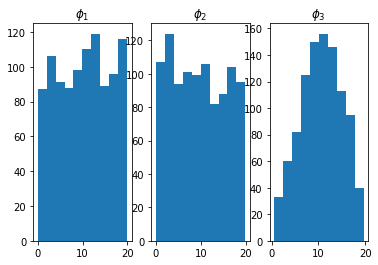

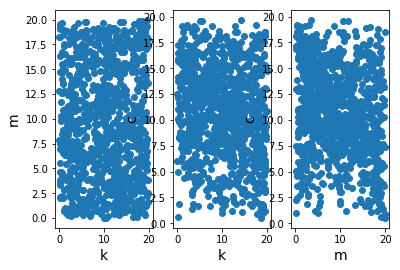

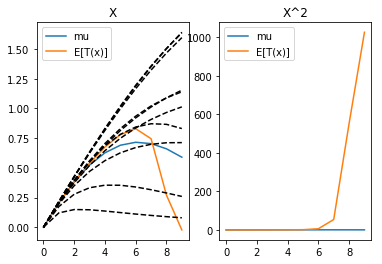

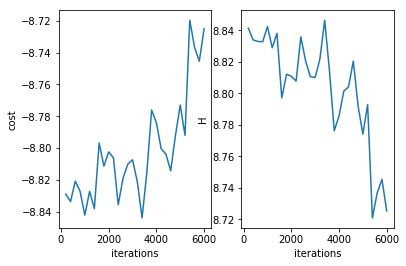

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 6200 
H 8.716951073160887
cost -8.715977039143661
system.D 3


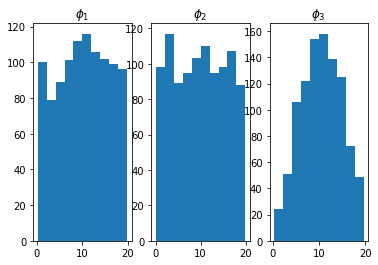

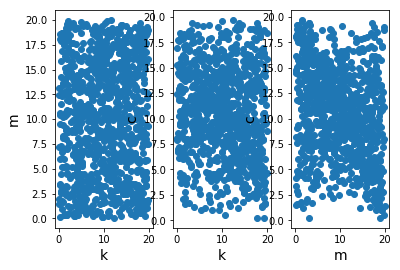

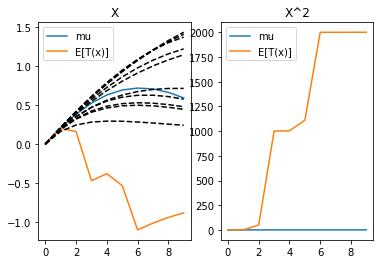

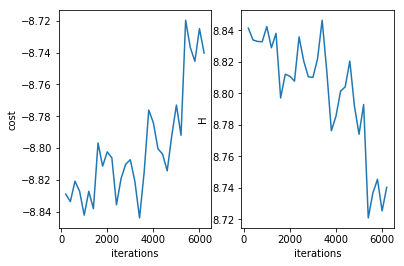

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 6400 
H 8.76889765495232
cost -8.768583277099399
system.D 3


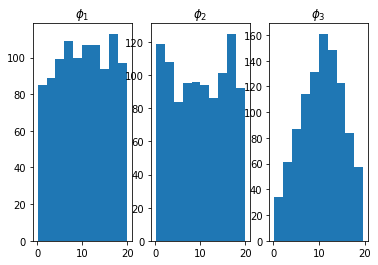

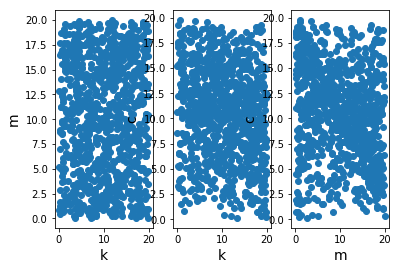

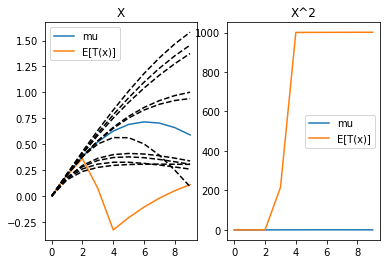

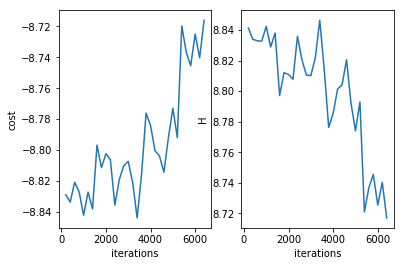

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 6600 
H 8.73387740993399
cost -8.73350840348243
system.D 3


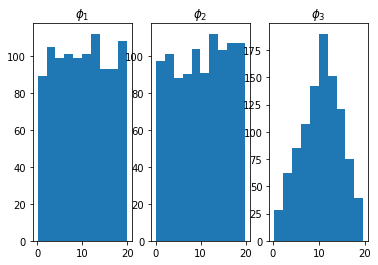

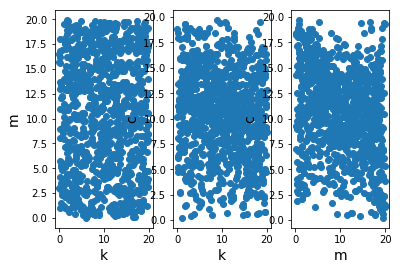

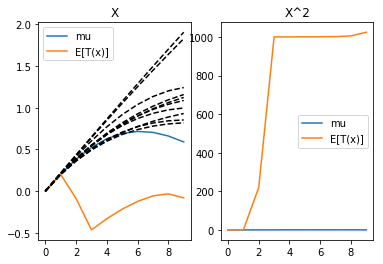

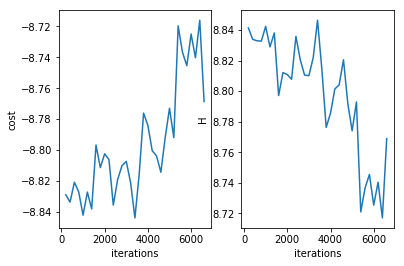

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 6800 
H 8.752621700744996
cost -8.752257371258825
system.D 3


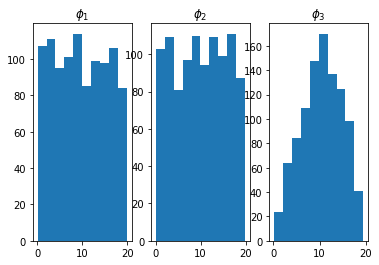

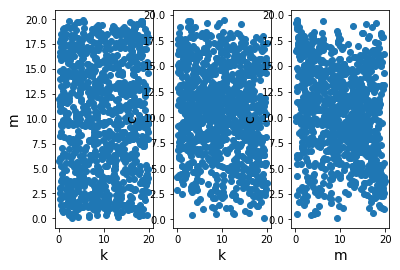

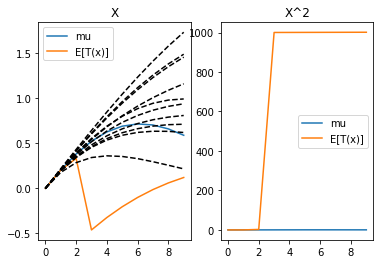

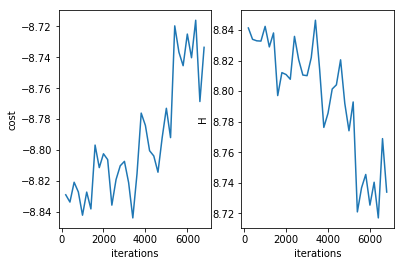

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 7000 
H 8.7297336632642
cost -8.728279082495424
system.D 3


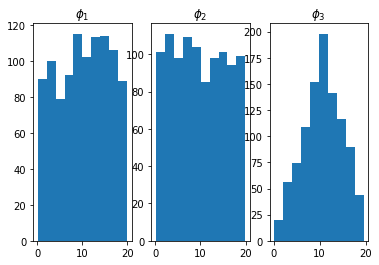

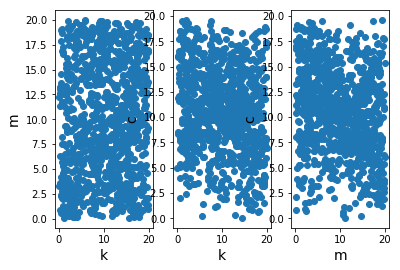

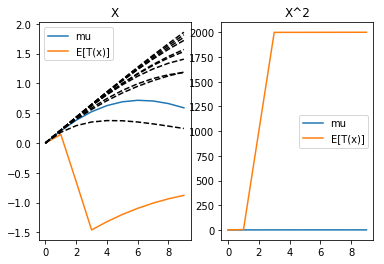

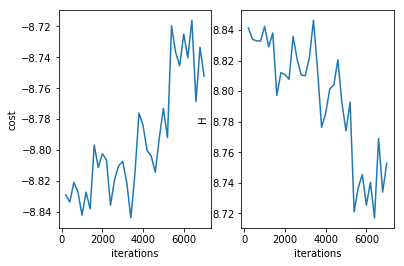

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 7200 
H 8.7482391171058
cost -8.747920672954436
system.D 3


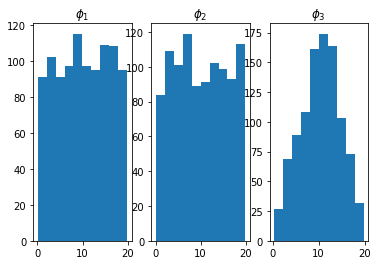

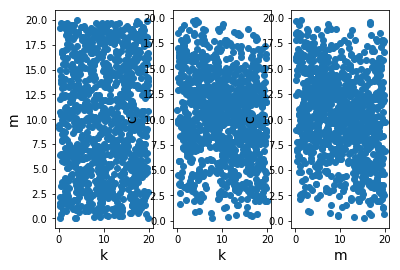

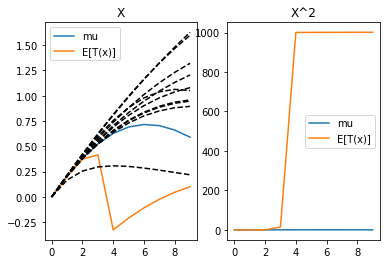

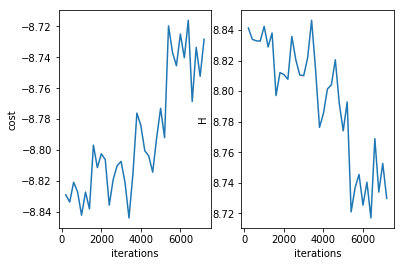

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 7400 
H 8.773210142610358
cost -8.773022744570131
system.D 3


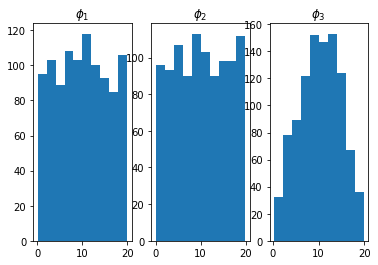

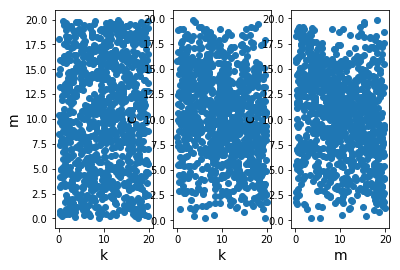

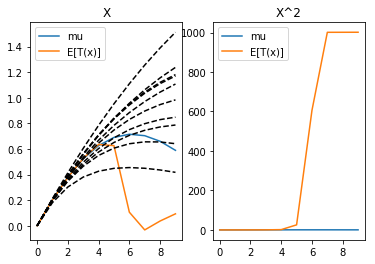

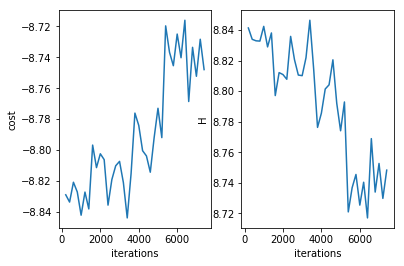

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 7600 
H 8.75116601781646
cost -8.75114358374229
system.D 3


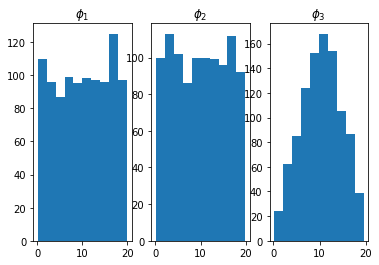

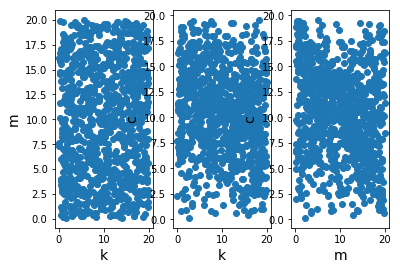

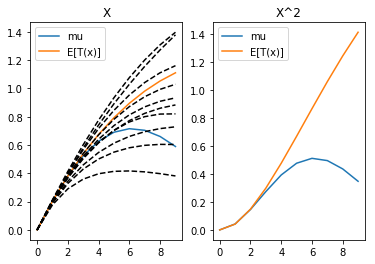

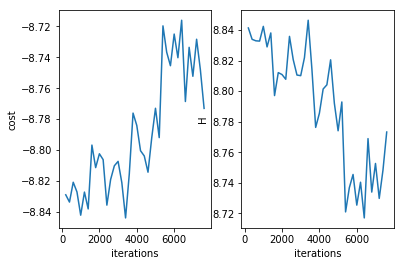

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 7800 
H 8.773687601730868
cost -8.773665297434075
system.D 3


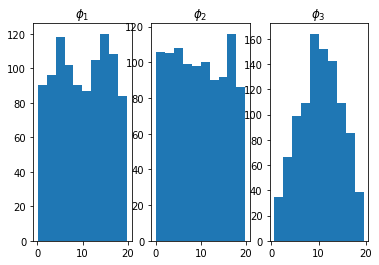

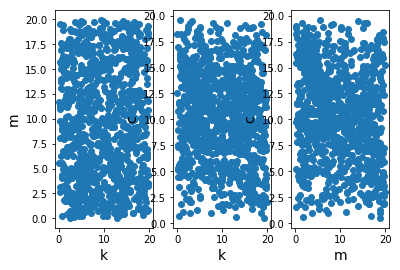

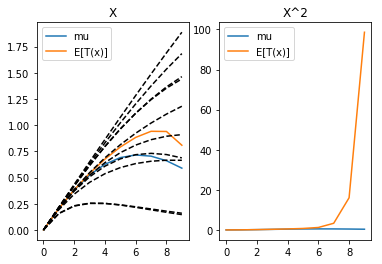

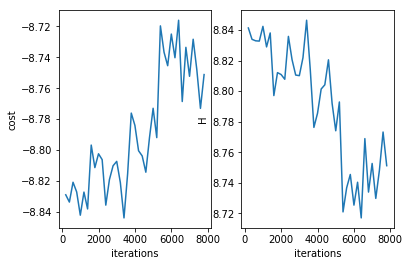

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 8000 
H 8.77440334181402
cost -8.774379698964553
system.D 3


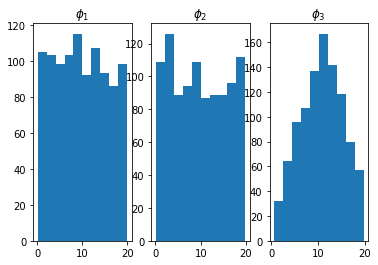

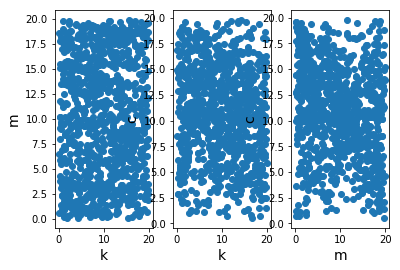

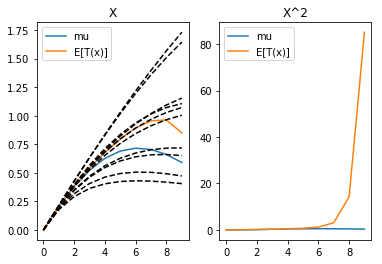

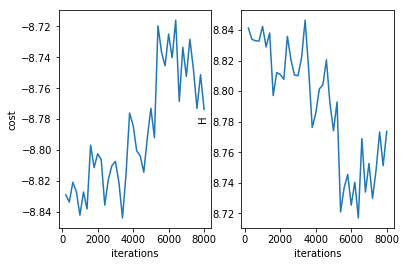

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 8200 
H 8.73426956133344
cost -8.734243379247877
system.D 3


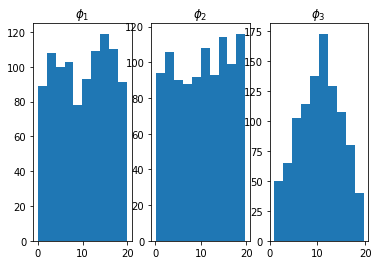

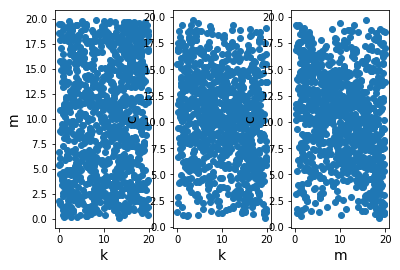

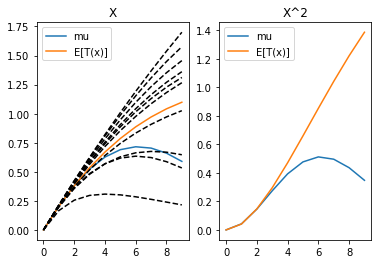

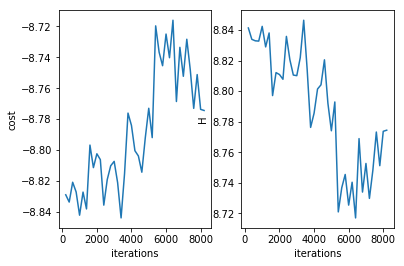

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 8400 
H 8.786682645485142
cost -8.786659522333755
system.D 3


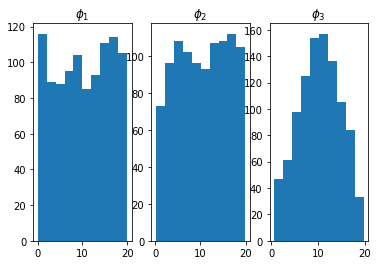

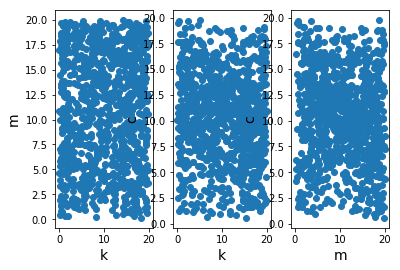

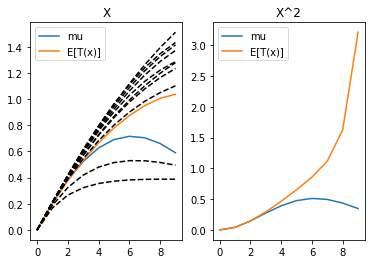

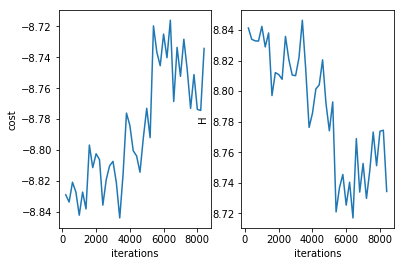

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 8600 
H 8.800437929235683
cost -8.800009419990142
system.D 3


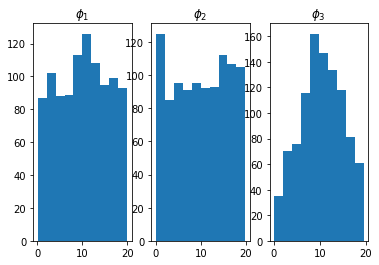

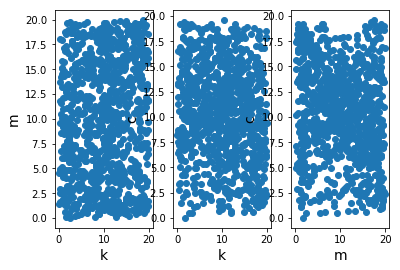

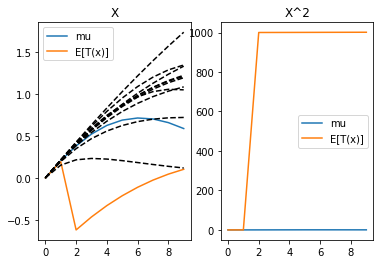

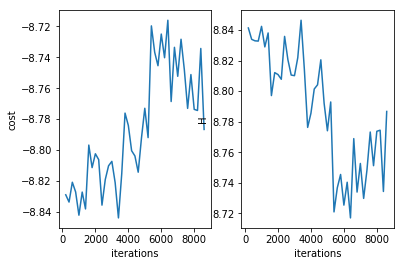

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 8800 
H 8.79819972210432
cost -8.797819687090621
system.D 3


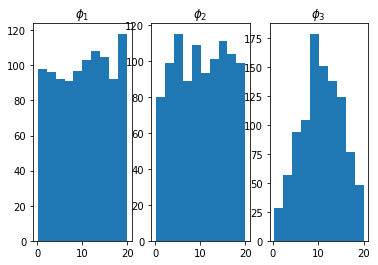

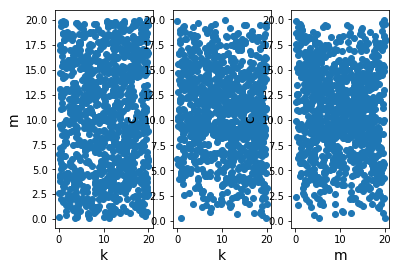

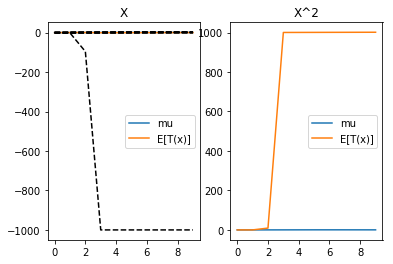

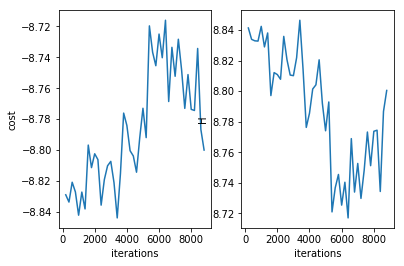

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 9000 
H 8.800635216626816
cost -8.800606556025404
system.D 3


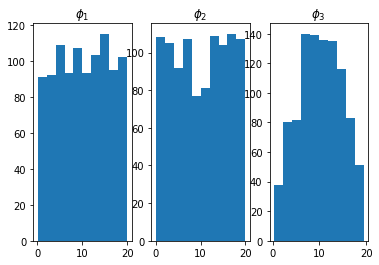

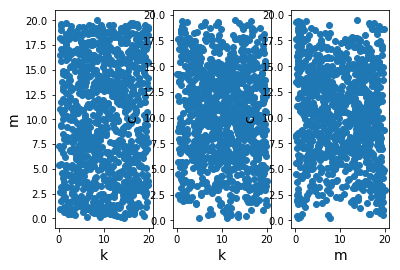

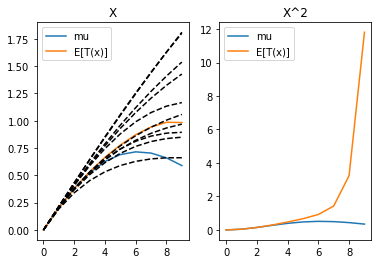

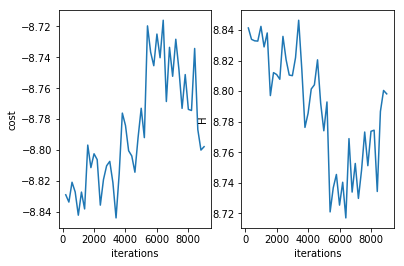

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 9200 
H 8.765264115889797
cost -8.764999912405566
system.D 3


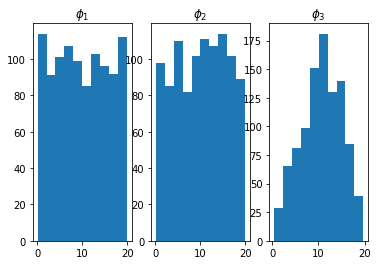

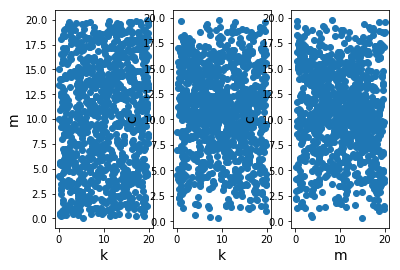

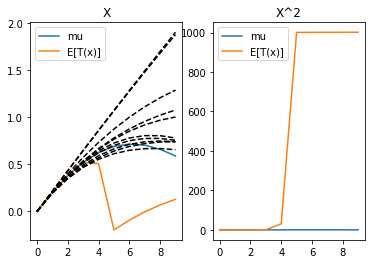

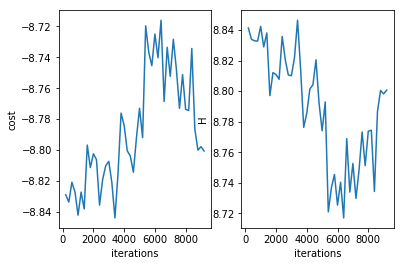

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 9400 
H 8.778450344325195
cost -8.77818596544612
system.D 3


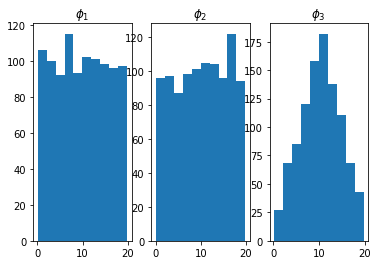

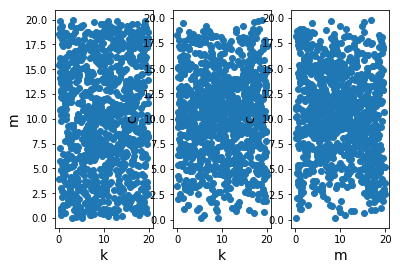

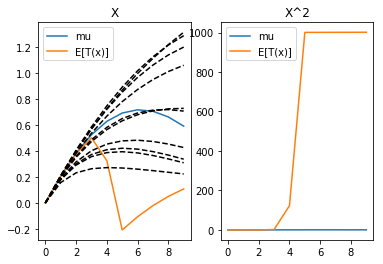

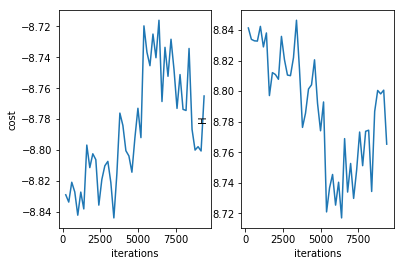

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 9600 
H 8.800306153748961
cost -8.793062450238716
system.D 3


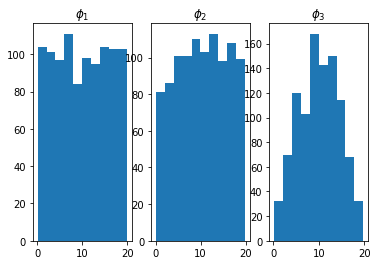

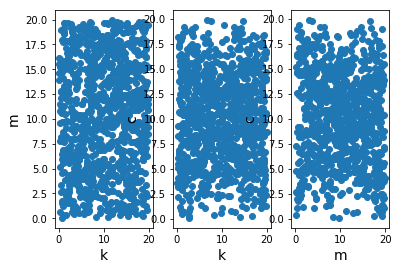

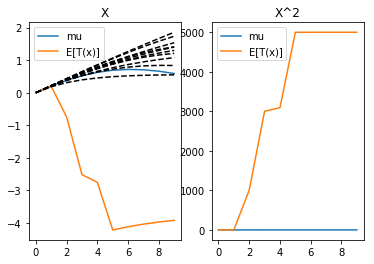

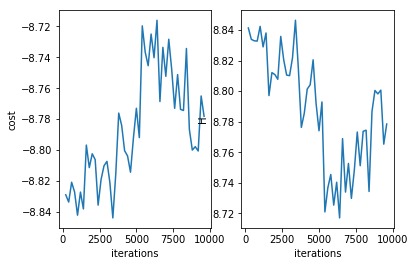

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 9800 
H 8.763836064418694
cost -8.763820226345574
system.D 3


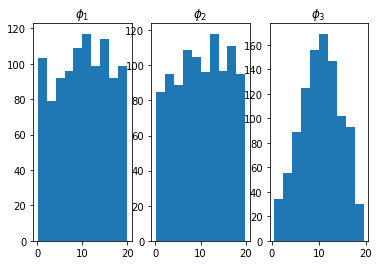

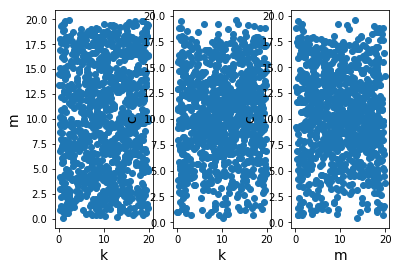

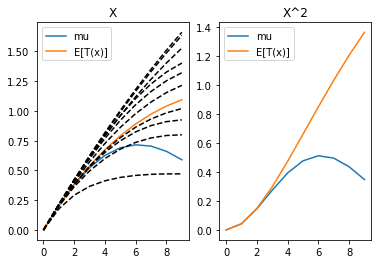

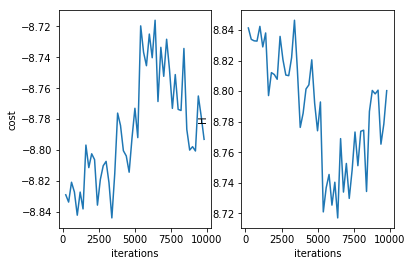

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 10000 
H 8.797730841019929
cost -8.797512656462864
system.D 3


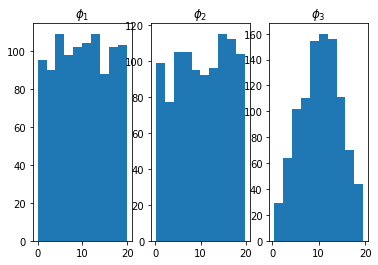

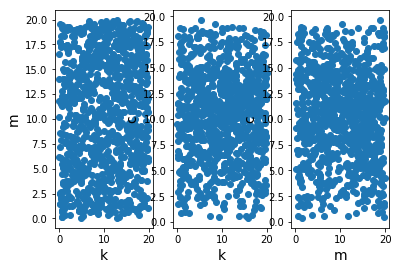

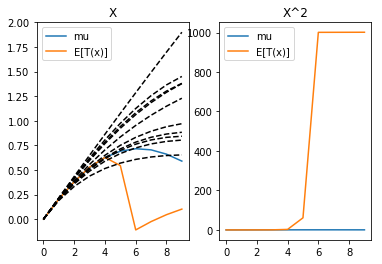

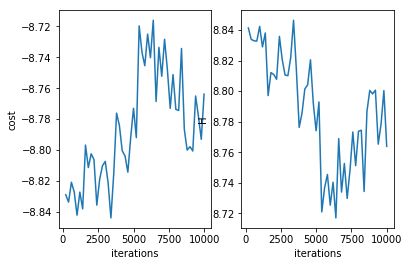

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/
AL iteration 2
resetting optimizer
aug lag it 1
lambda [ 0.00000000e+00 -2.62263590e-12 -1.12498387e-10 -2.09238067e-10
 -2.75377100e-10 -3.96876933e-10 -3.96089154e-10 -4.06856776e-10
 -4.61350206e-10 -4.57519954e-10 -1.00000000e-14  2.50722161e-11
  1.01025240e-07  2.00334609e-07  2.31311931e-07  4.00075580e-07
  4.00714525e-07  4.07705765e-07  4.85542989e-07  5.00120234e-07]
c 4e-10
saving model at iter 0
******************************************
it = 10200 
H 8.94457021152868
cost -8.926157347607361
system.D 3


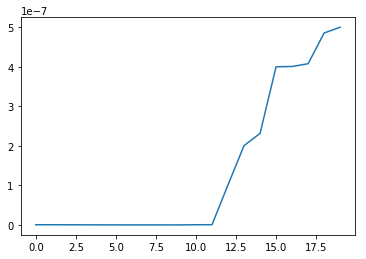

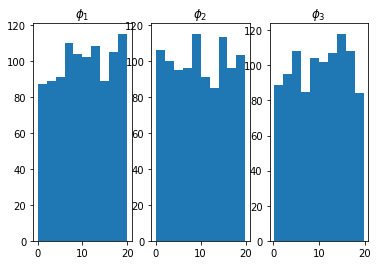

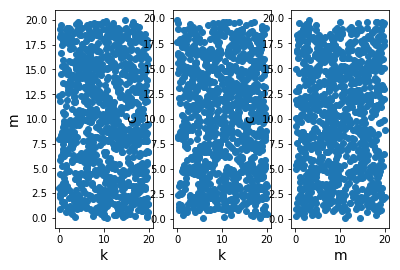

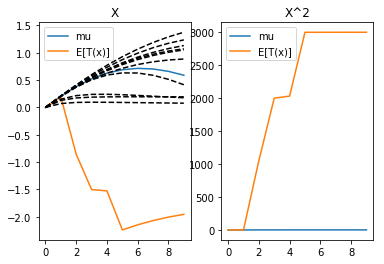

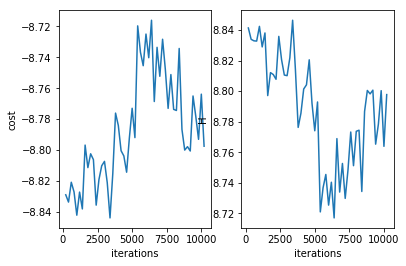

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 10400 
H 8.944064995439389
cost -8.923795283724235
system.D 3


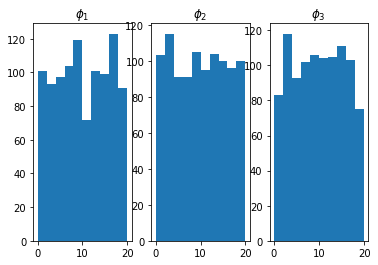

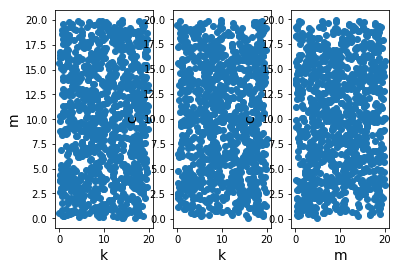

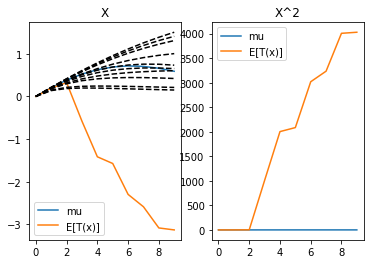

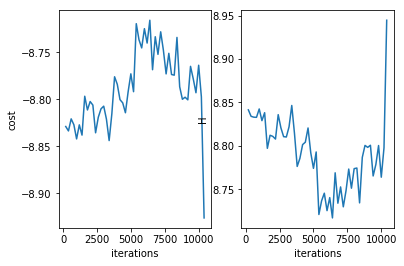

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 10600 
H 8.94566273208997
cost -8.896682787244972
system.D 3


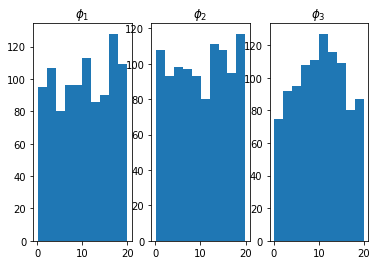

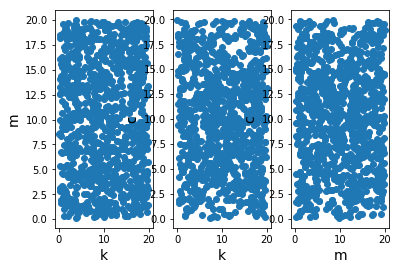

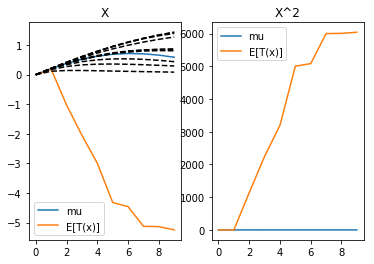

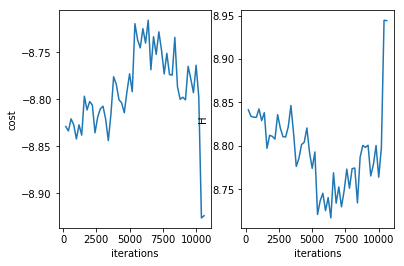

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 10800 
H 8.938076493970044
cost -8.915353368293877
system.D 3


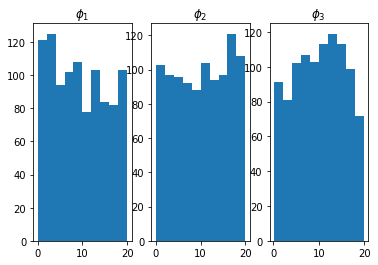

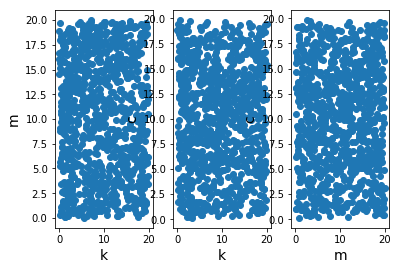

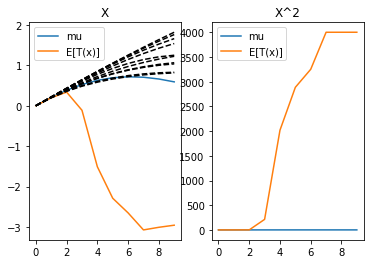

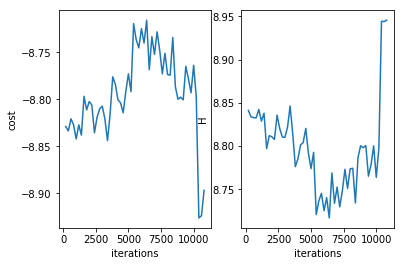

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 11000 
H 8.931768727956896
cost -8.921263650433598
system.D 3


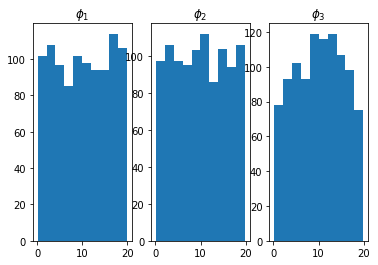

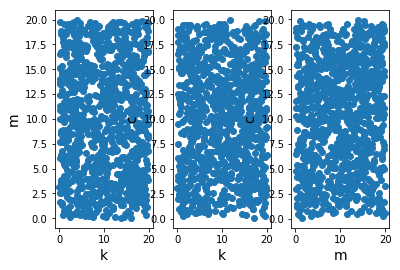

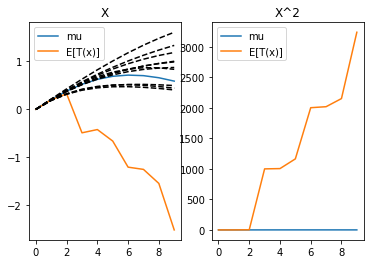

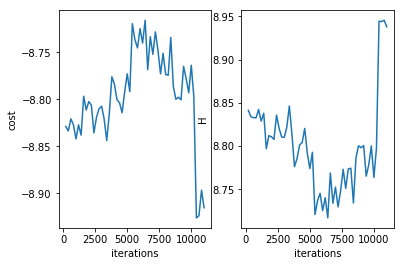

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 11200 
H 8.93893339892168
cost -8.935298621655795
system.D 3


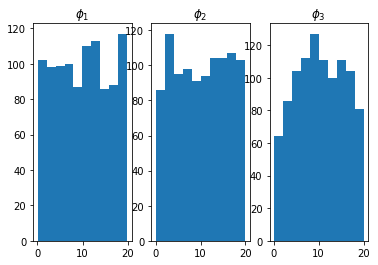

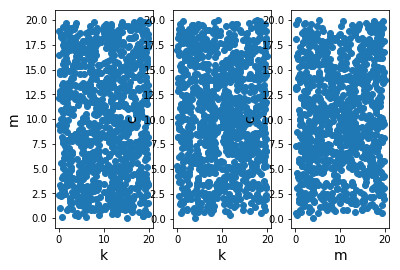

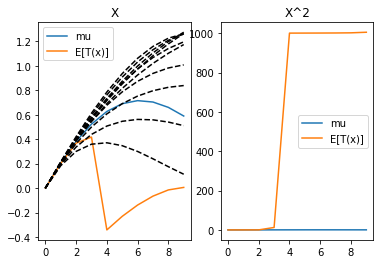

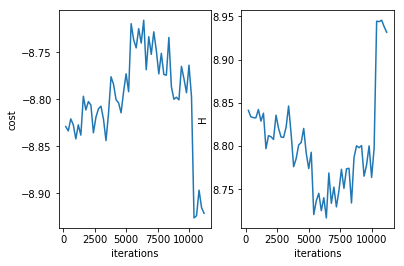

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 11400 
H 8.93456473829478
cost -8.902864991496061
system.D 3


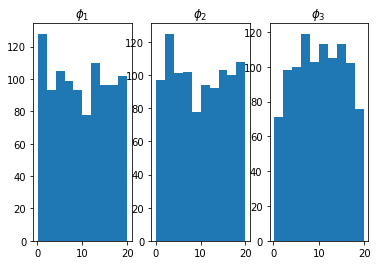

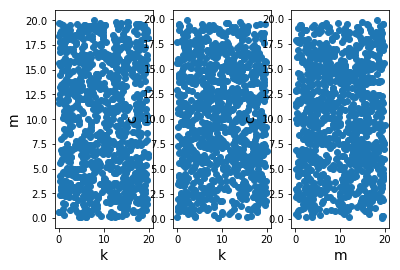

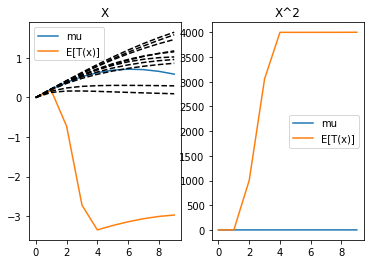

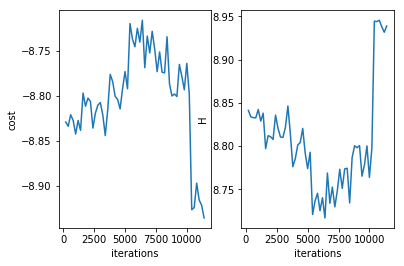

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 11600 
H 8.94079692102287
cost -8.929565532230379
system.D 3


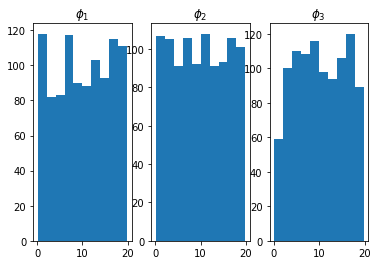

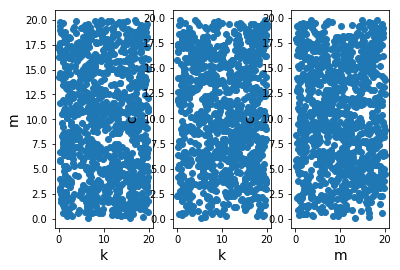

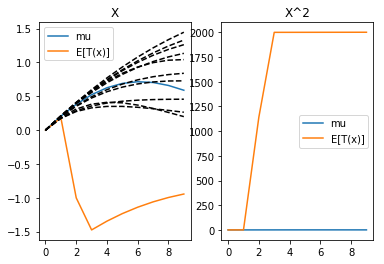

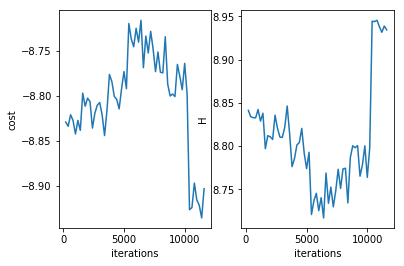

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 11800 
H 8.924393239432701
cost -8.915292410455717
system.D 3


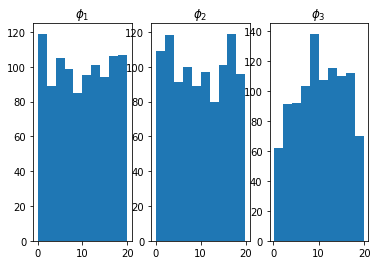

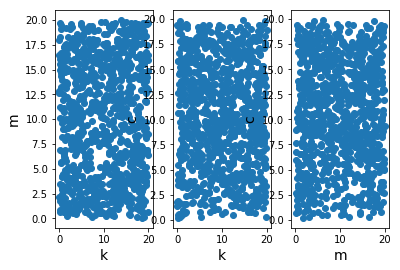

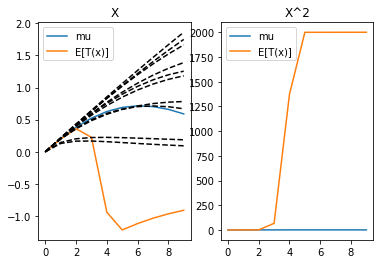

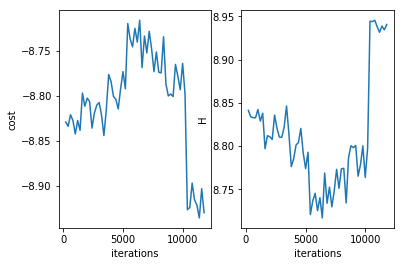

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 12000 
H 8.92964774501472
cost -8.91570880038148
system.D 3


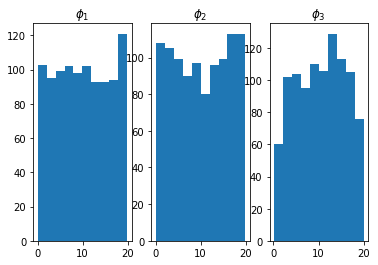

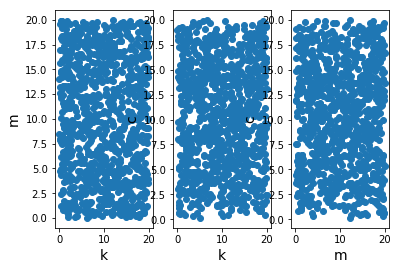

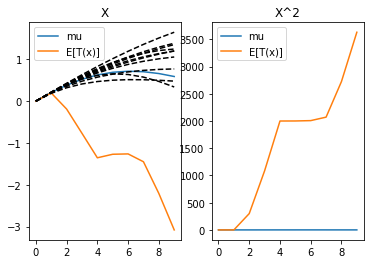

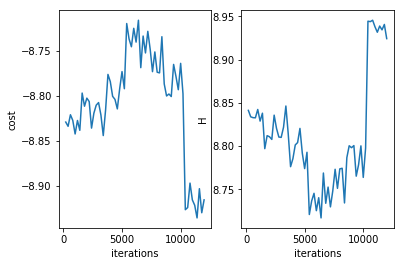

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 12200 
H 8.945370842197324
cost -8.9453685859941
system.D 3


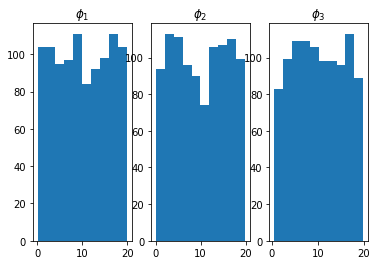

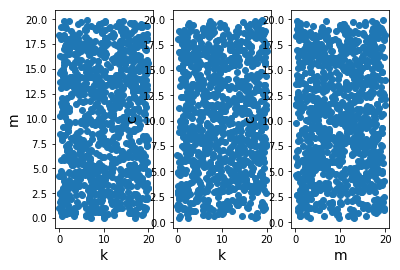

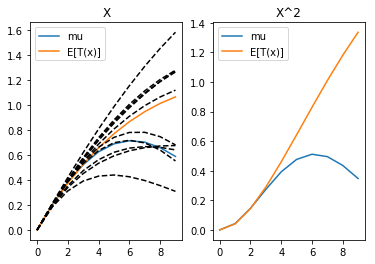

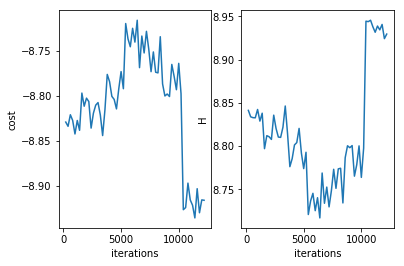

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 12400 
H 8.92821764807698
cost -8.906721610545665
system.D 3


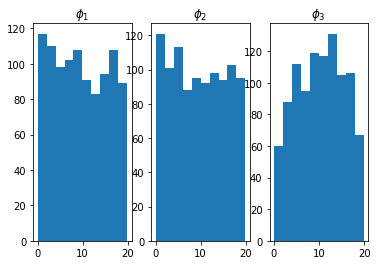

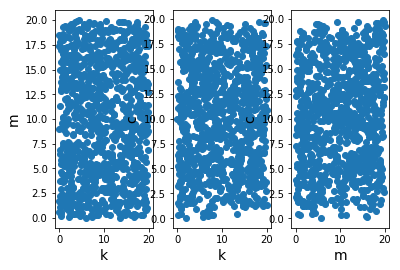

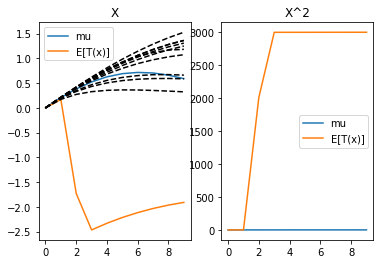

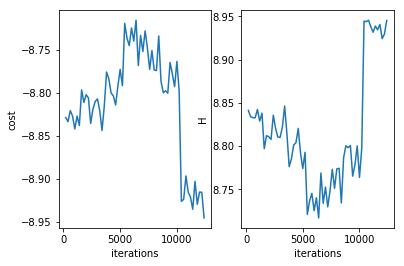

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 12600 
H 8.928709845350086
cost -8.92467508270844
system.D 3


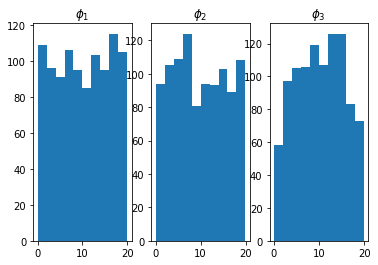

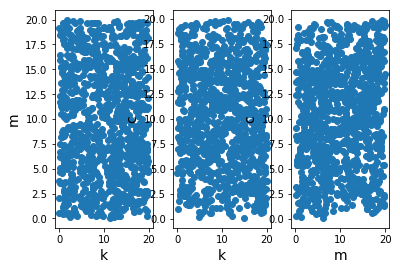

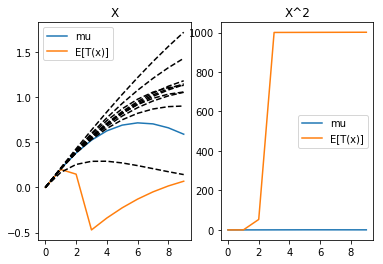

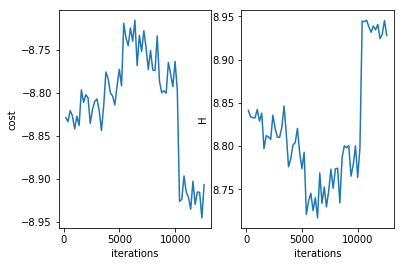

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 12800 
H 8.916307234346318
cost -8.883685461621045
system.D 3


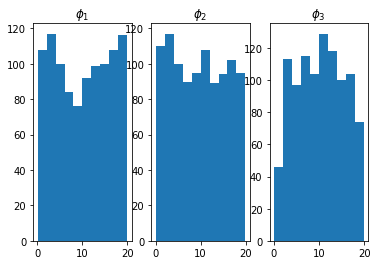

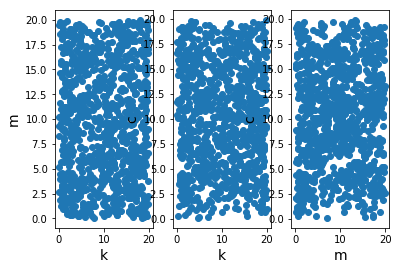

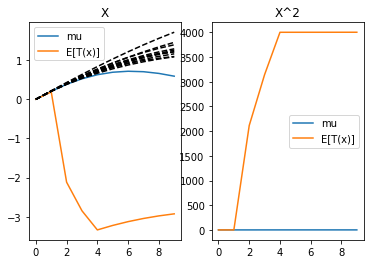

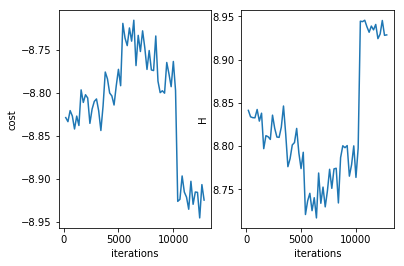

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 13000 
H 8.916249622961725
cost -8.906596095661099
system.D 3


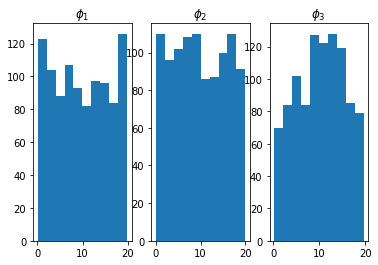

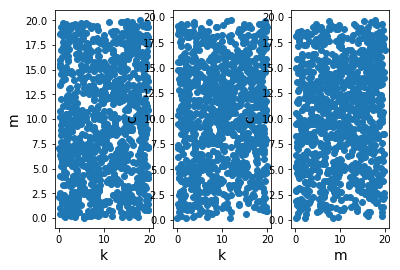

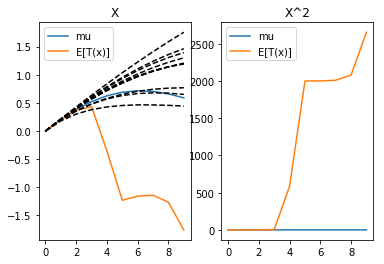

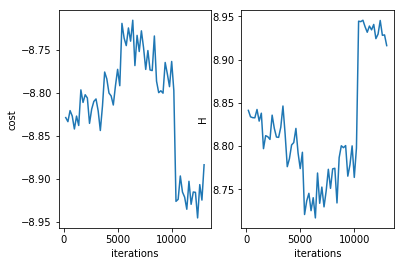

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 13200 
H 8.894867267037615
cost -8.894864089650804
system.D 3


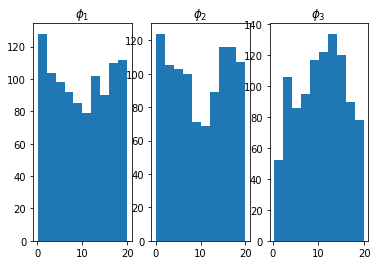

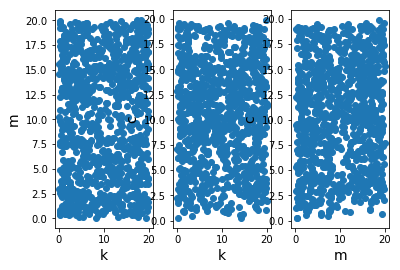

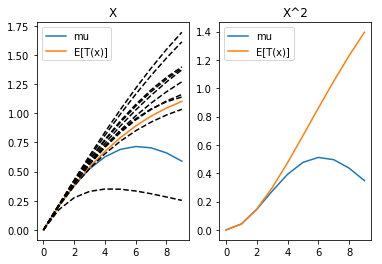

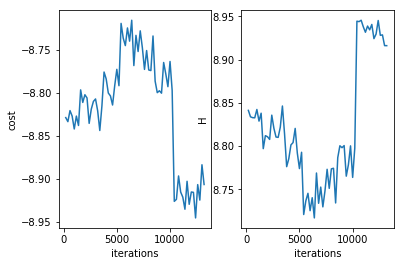

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 13400 
H 8.895777530291719
cost -8.885703485097416
system.D 3


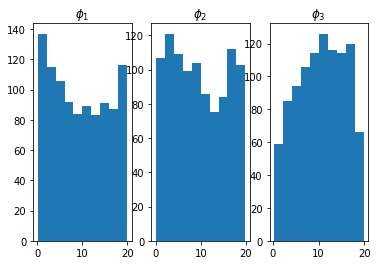

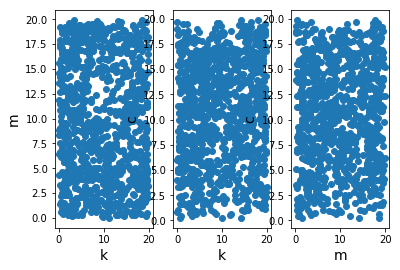

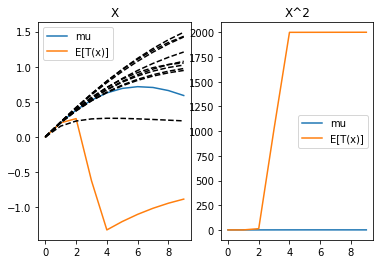

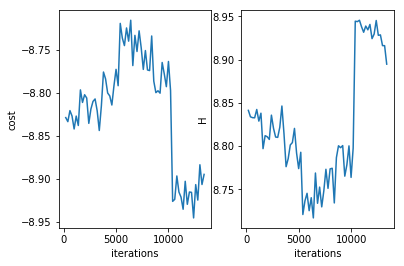

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 13600 
H 8.897931480155888
cost -8.89792809018795
system.D 3


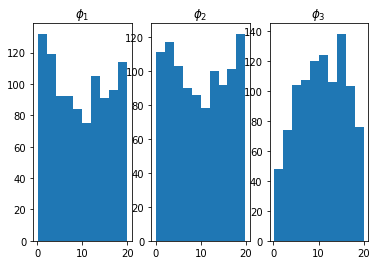

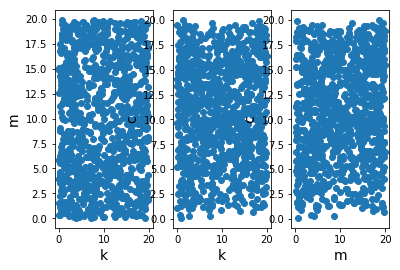

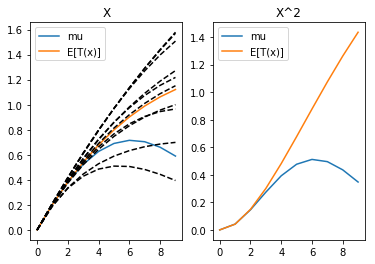

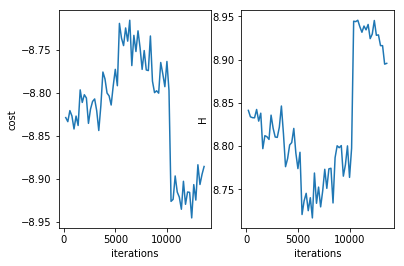

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 13800 
H 8.888710497507637
cost -8.88652936286097
system.D 3


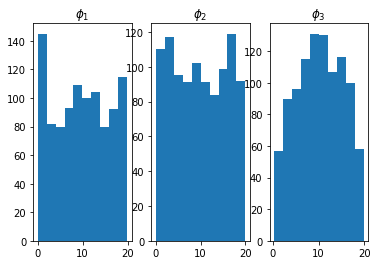

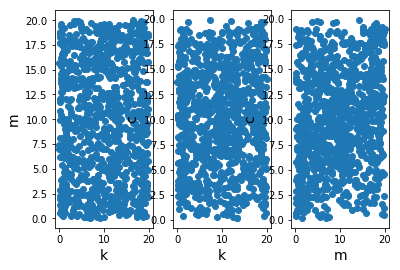

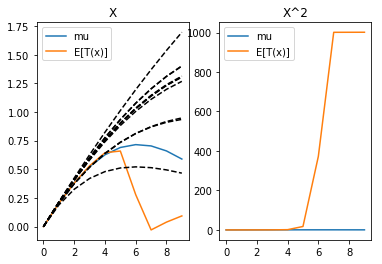

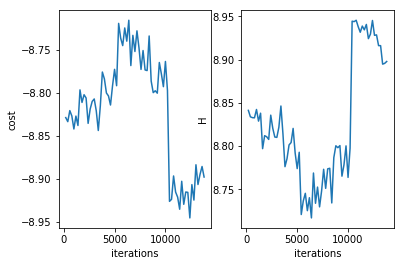

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 14000 
H 8.915292283828952
cost -8.911654304405163
system.D 3


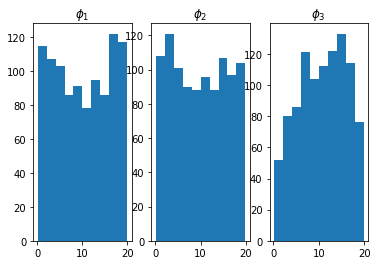

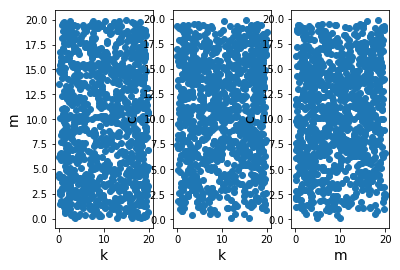

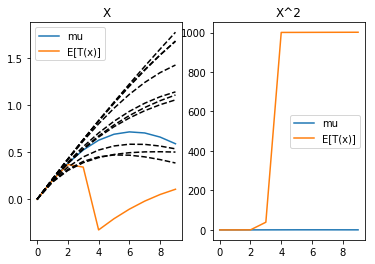

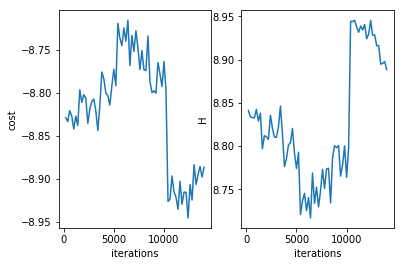

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 14200 
H 8.89428822118664
cost -8.894284680676092
system.D 3


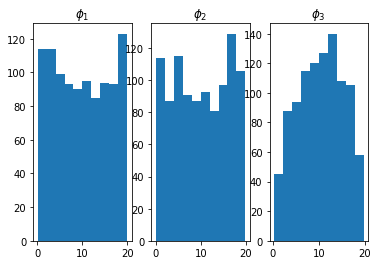

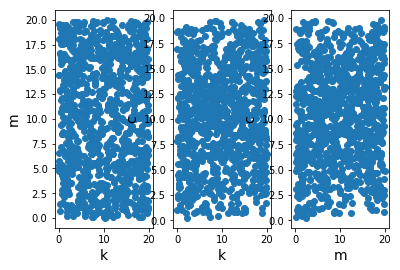

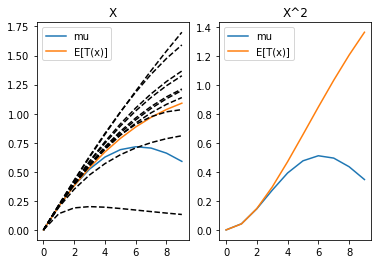

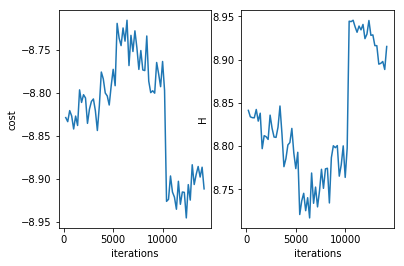

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 14400 
H 8.904587249299496
cost -8.903055274291535
system.D 3


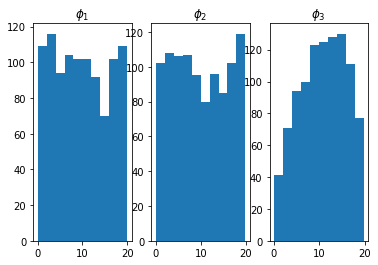

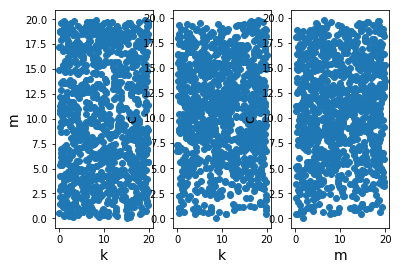

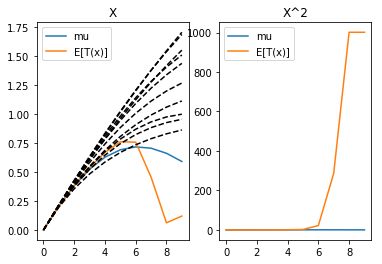

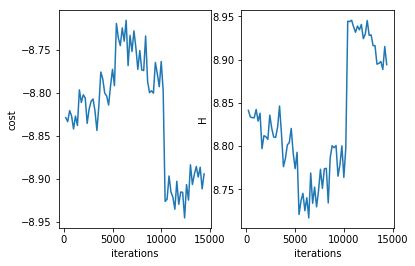

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 14600 
H 8.890131556372625
cost -8.890120895079173
system.D 3


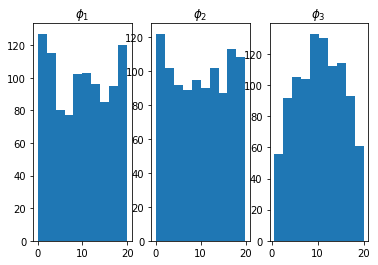

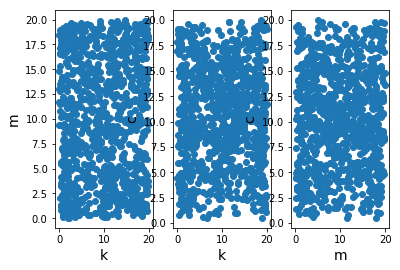

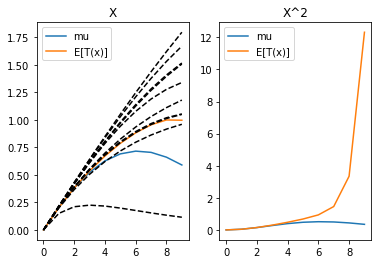

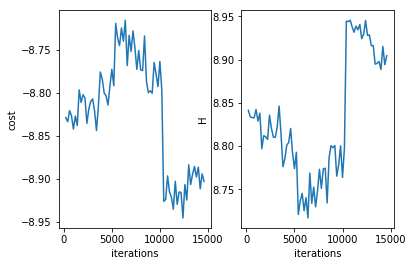

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 14800 
H 8.896805643860887
cost -8.89680126580678
system.D 3


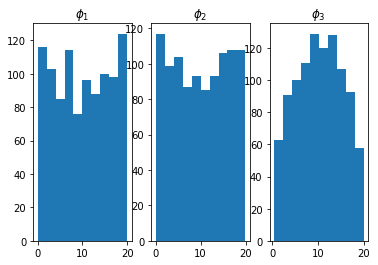

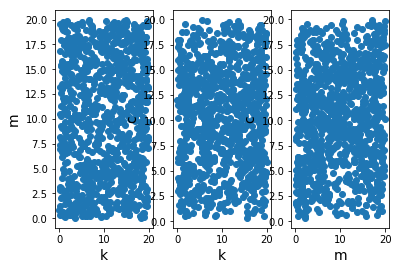

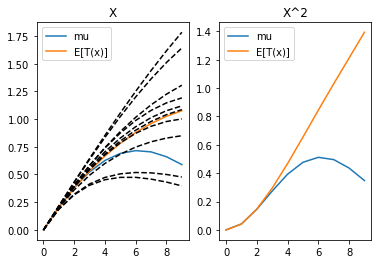

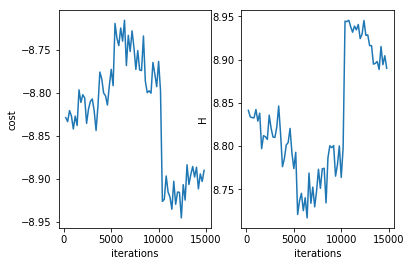

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 15000 
H 8.869767969849923
cost -8.865435886640283
system.D 3


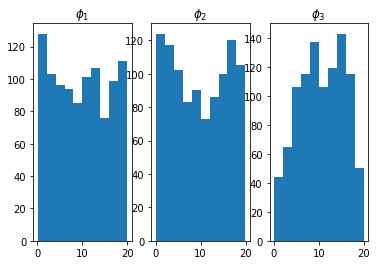

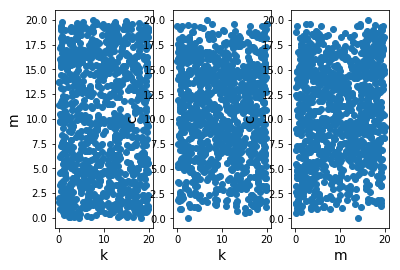

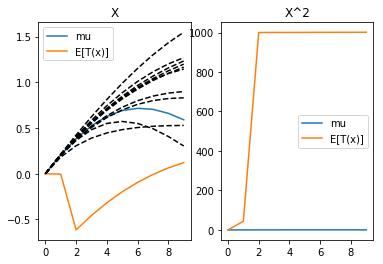

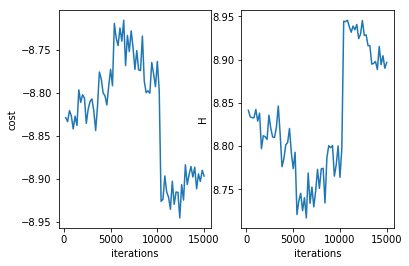

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 15200 
H 8.842423467773774
cost -8.83863376385956
system.D 3


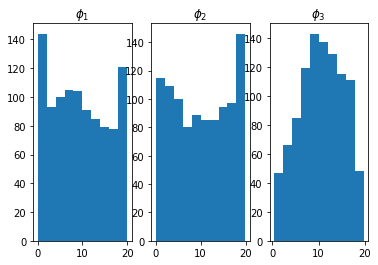

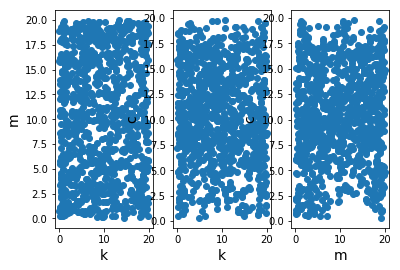

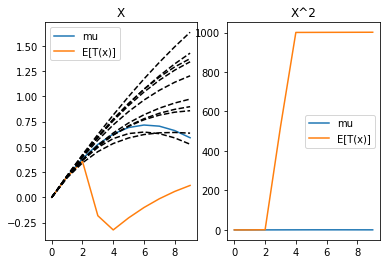

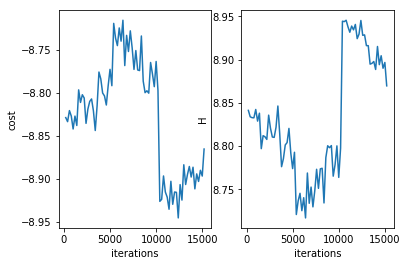

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 15400 
H 8.857036644738722
cost -8.852920874056272
system.D 3


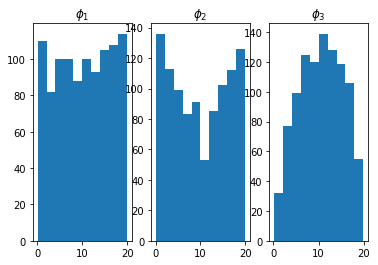

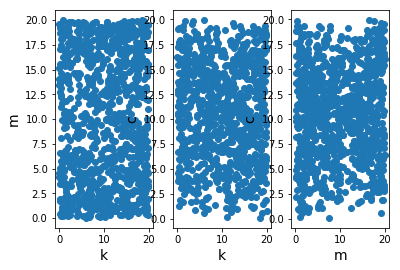

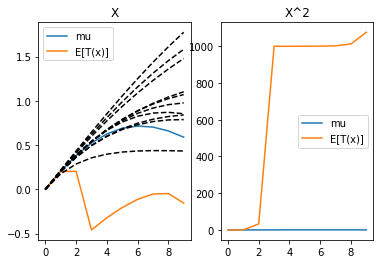

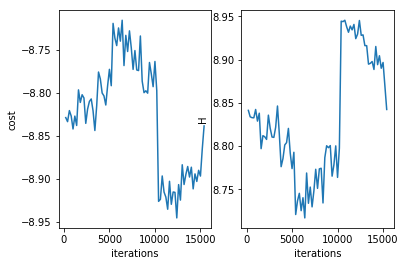

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 15600 
H 8.861291187591474
cost -8.85899801494171
system.D 3


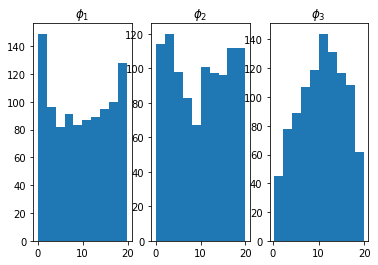

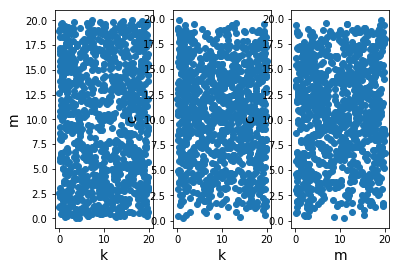

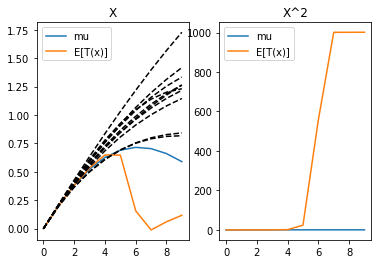

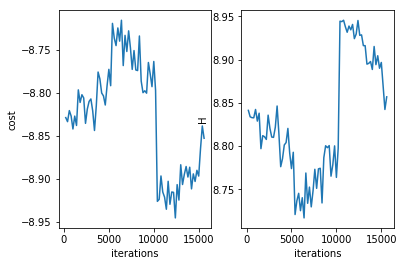

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 15800 
H 8.86557107891259
cost -8.862802628395794
system.D 3


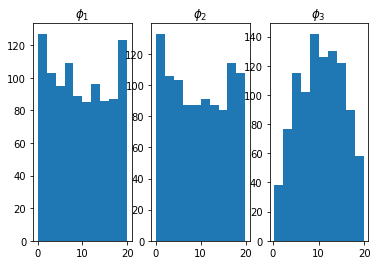

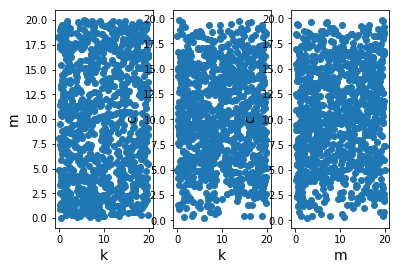

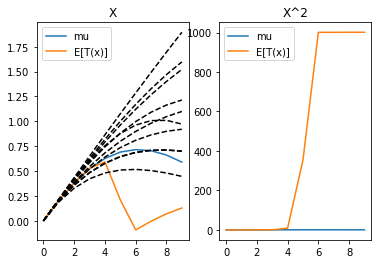

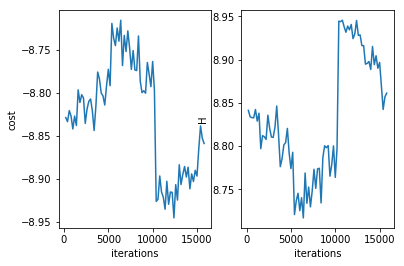

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 16000 
H 8.844556123053026
cost -8.844551275411687
system.D 3


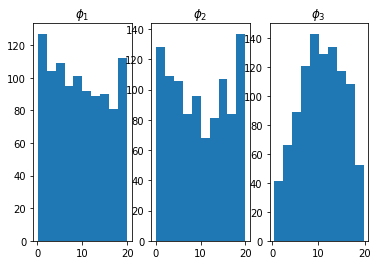

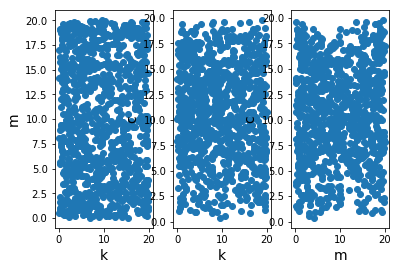

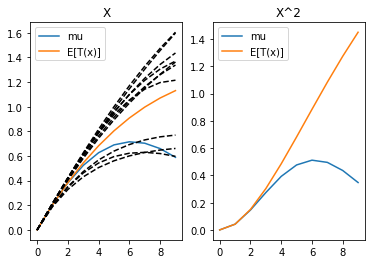

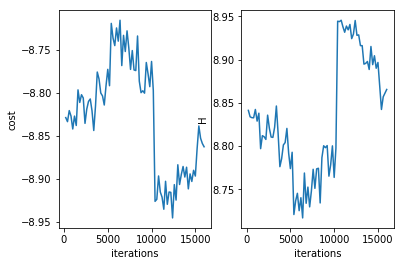

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 16200 
H 8.874853237360604
cost -8.873912782142213
system.D 3


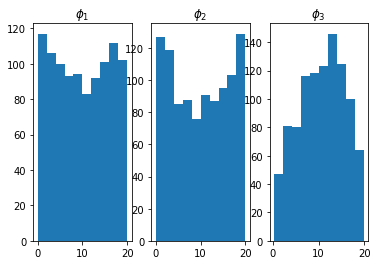

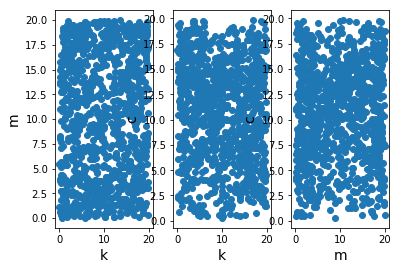

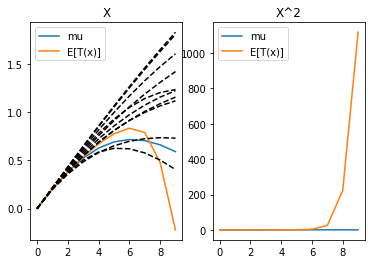

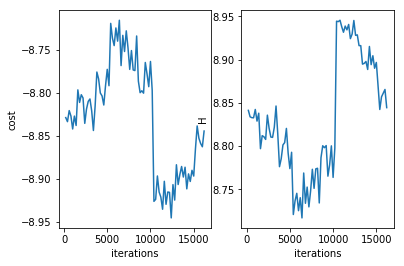

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 16400 
H 8.83952193335988
cost -8.835879707740819
system.D 3


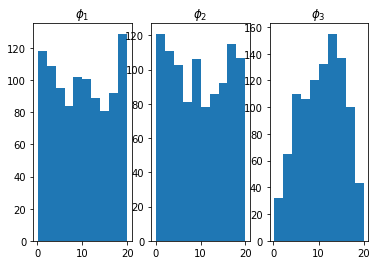

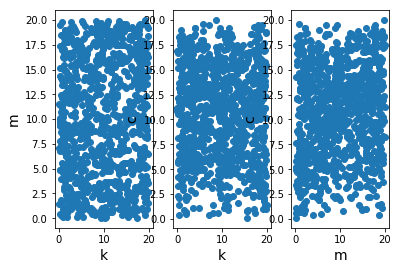

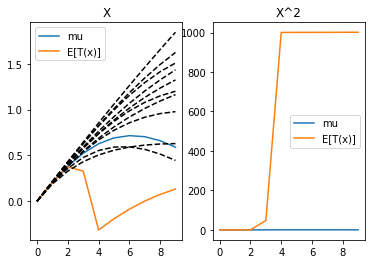

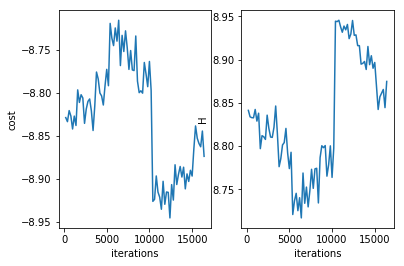

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 16600 
H 8.864673445955086
cost -8.860891463549592
system.D 3


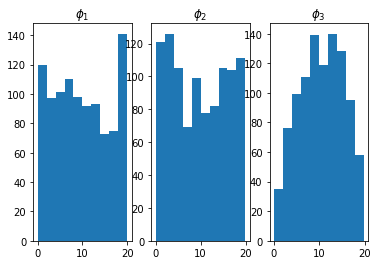

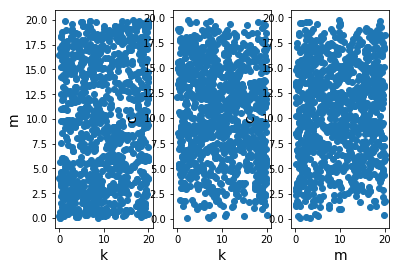

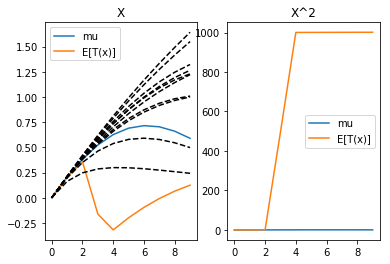

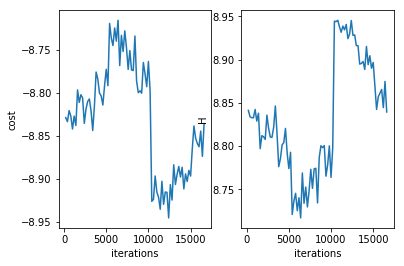

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 16800 
H 8.851401713237308
cost -8.851394708552814
system.D 3


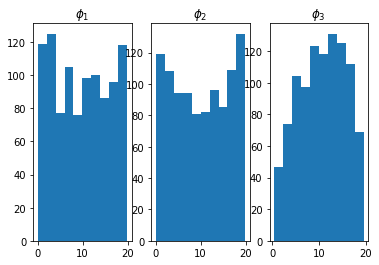

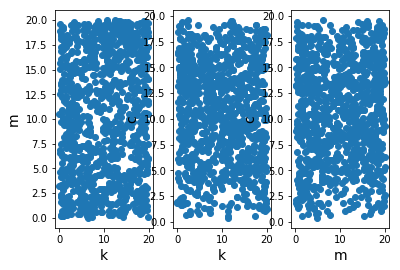

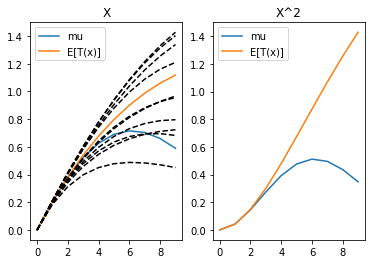

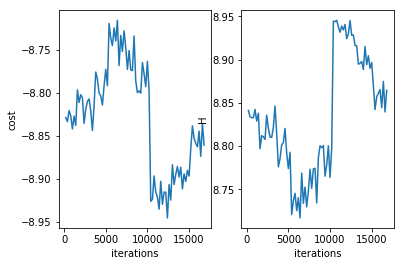

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 17000 
H 8.859233114627608
cost -8.859218299633321
system.D 3


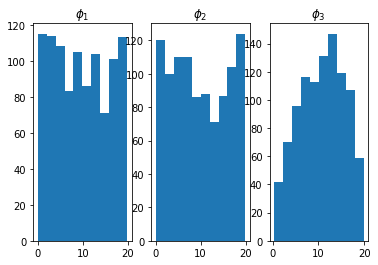

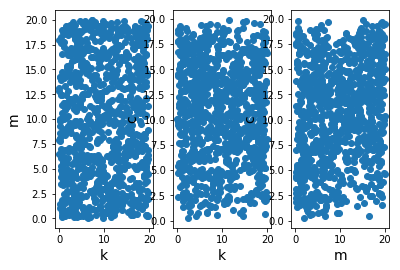

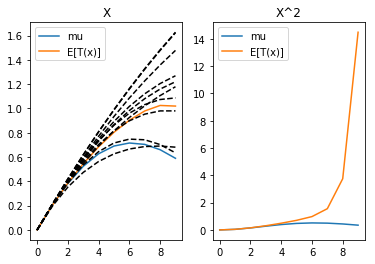

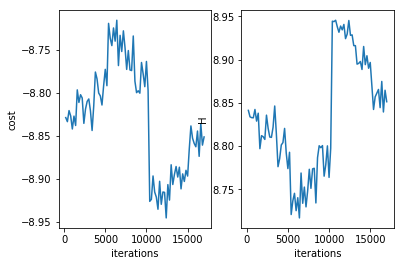

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 17200 
H 8.84360270295471
cost -8.843594622052924
system.D 3


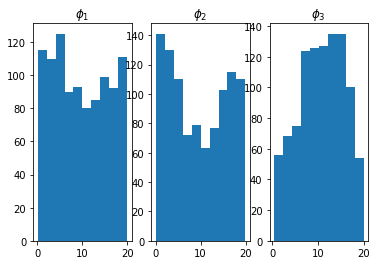

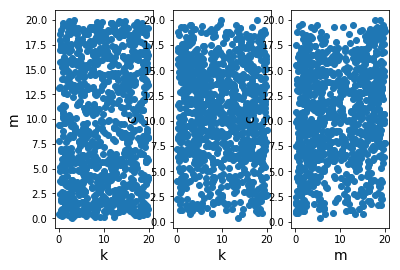

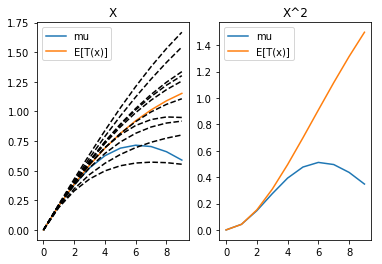

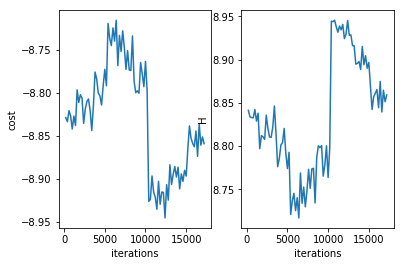

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 17400 
H 8.854344977281134
cost -8.850664623249479
system.D 3


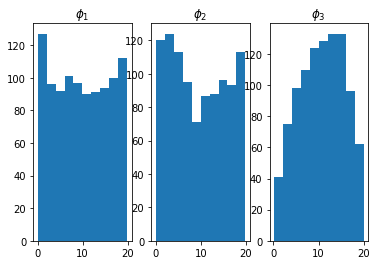

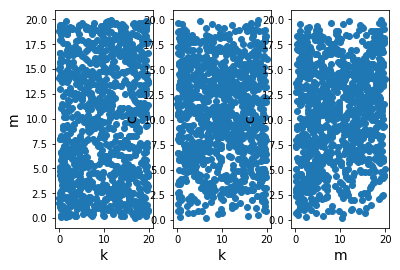

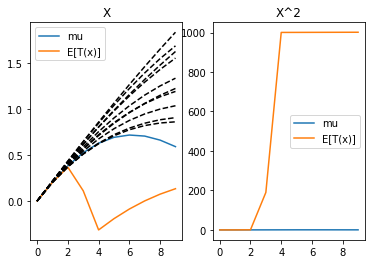

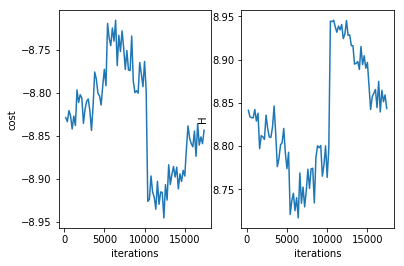

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 17600 
H 8.861993527368952
cost -8.852587236286556
system.D 3


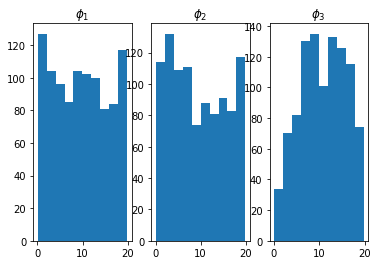

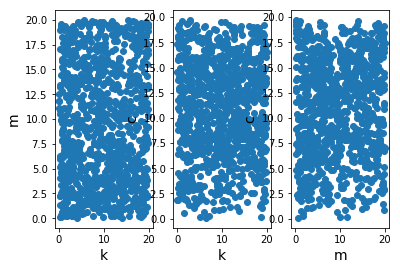

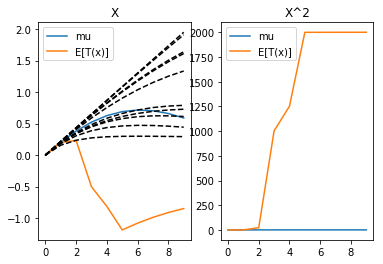

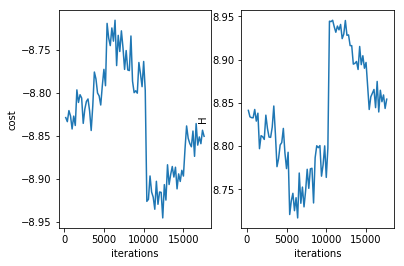

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 17800 
H 8.838142640940845
cost -8.838132563407017
system.D 3


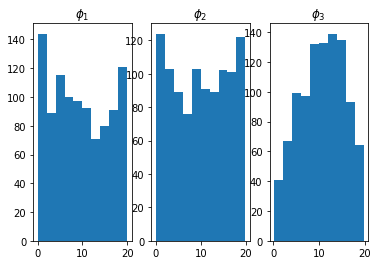

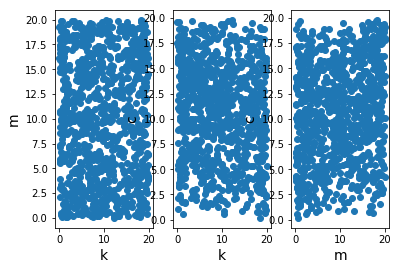

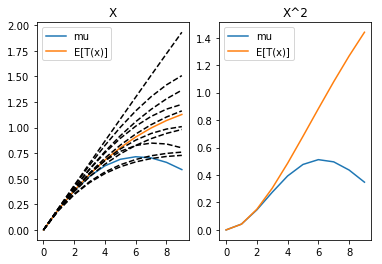

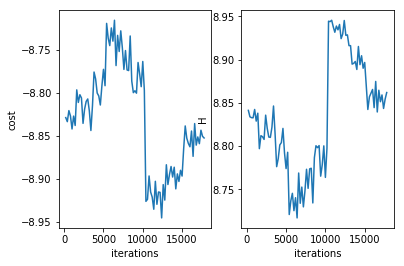

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 18000 
H 8.854095206883652
cost -8.854085381483504
system.D 3


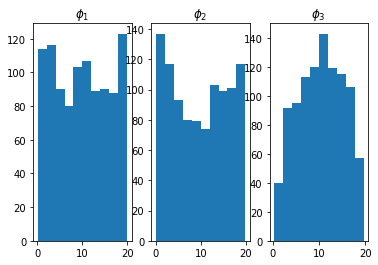

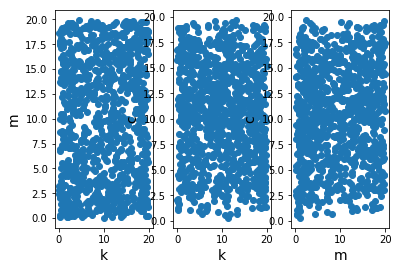

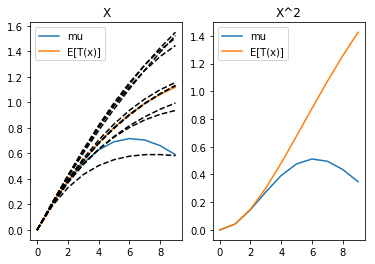

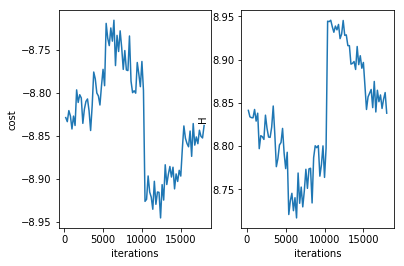

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 18200 
H 8.856882865440015
cost -8.852707980777149
system.D 3


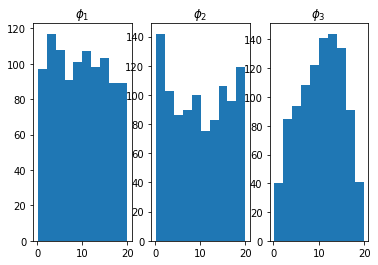

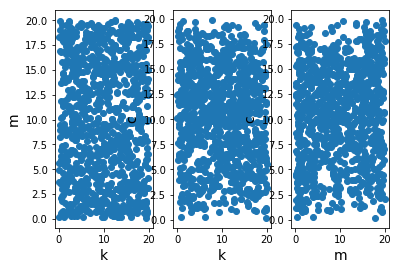

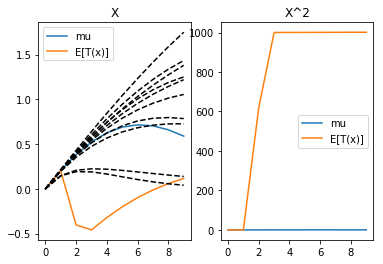

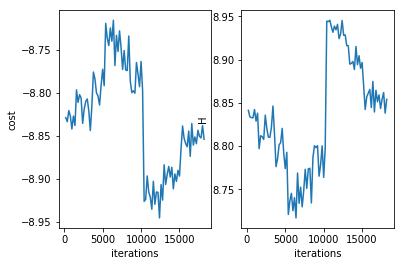

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 18400 
H 8.859867868287237
cost -8.859857450519954
system.D 3


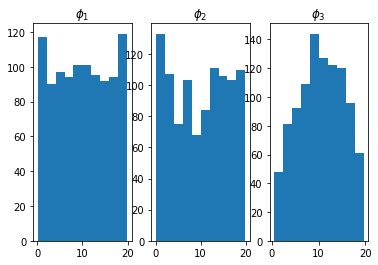

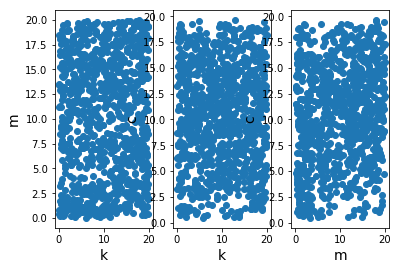

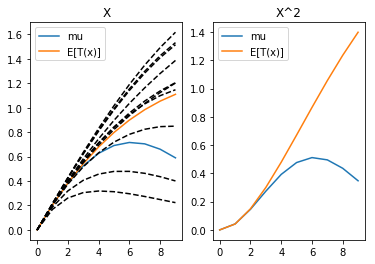

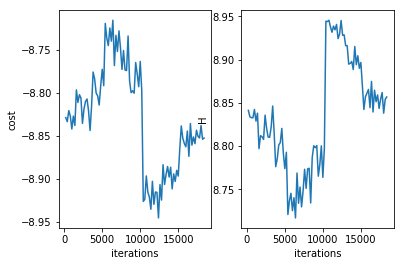

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 18600 
H 8.864743874489786
cost -8.86473198856686
system.D 3


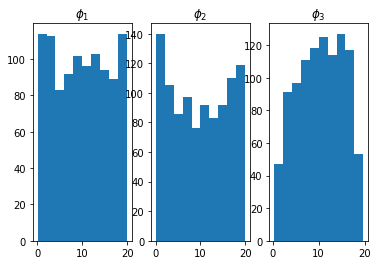

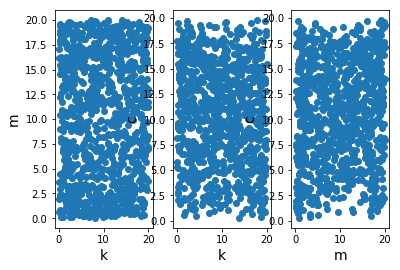

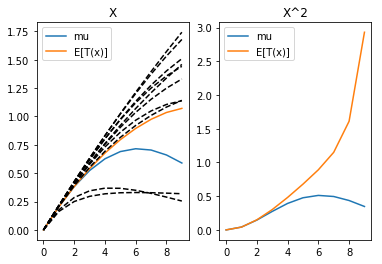

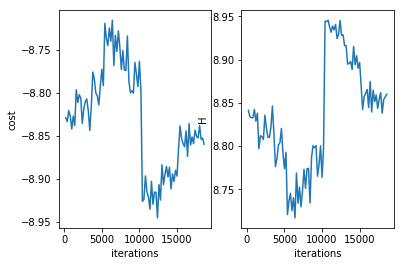

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 18800 
H 8.884719947889442
cost -8.861951636759395
system.D 3


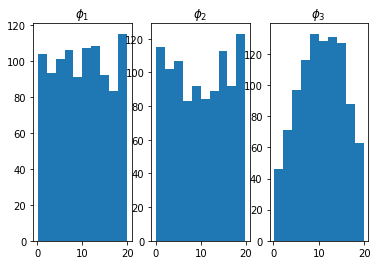

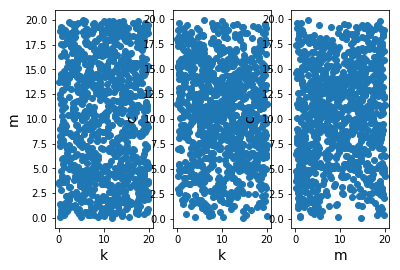

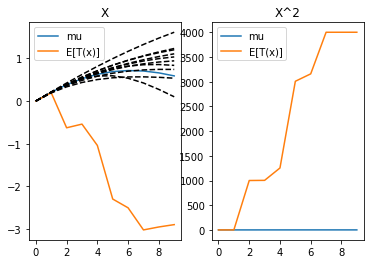

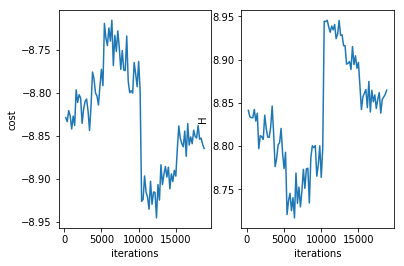

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 19000 
H 8.875906954280035
cost -8.866658677793435
system.D 3


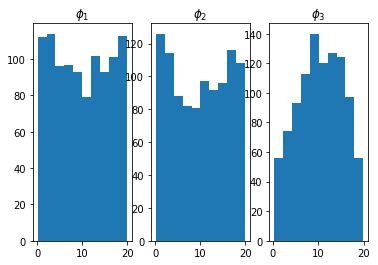

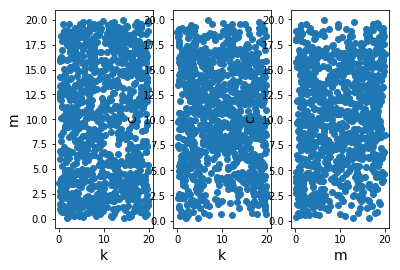

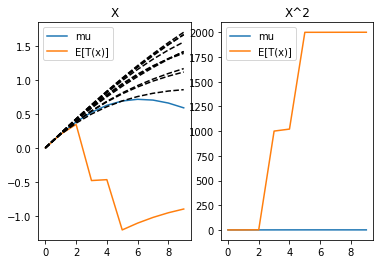

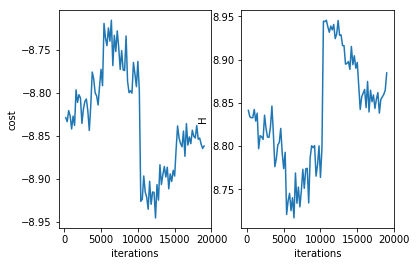

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 19200 
H 8.881261773678512
cost -8.880754409119966
system.D 3


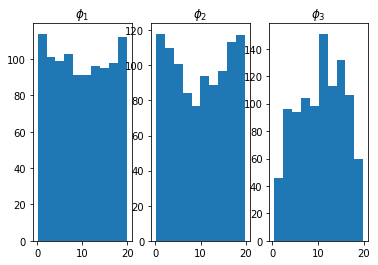

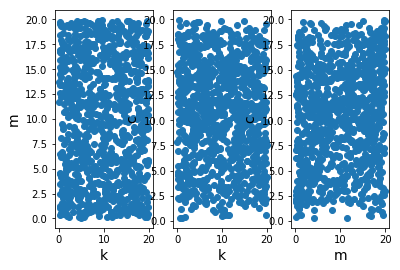

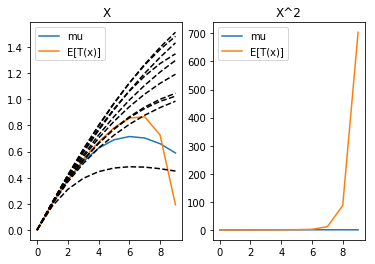

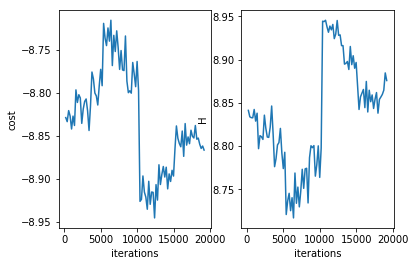

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 19400 
H 8.889257138533372
cost -8.873491363449387
system.D 3


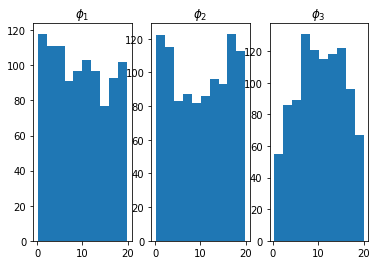

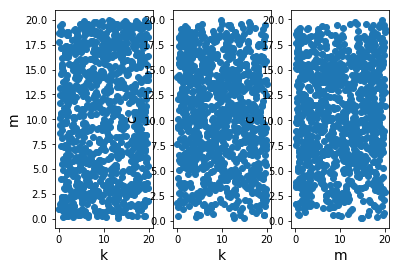

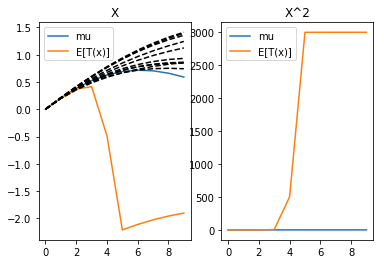

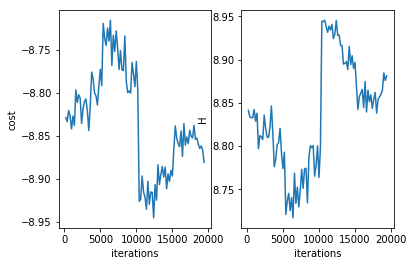

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 19600 
H 8.850193274768888
cost -8.850175122621327
system.D 3


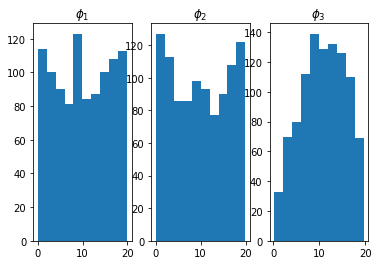

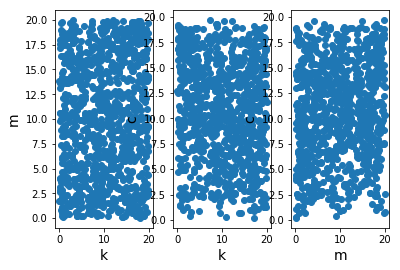

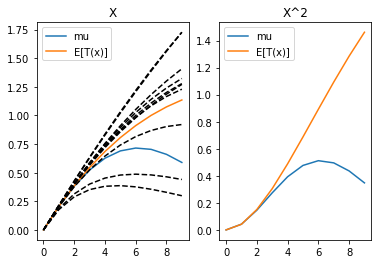

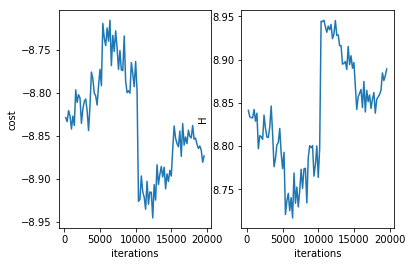

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 19800 
H 8.889823201580915
cost -8.884251468601196
system.D 3


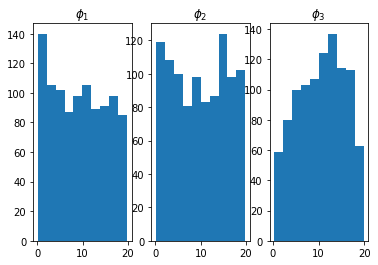

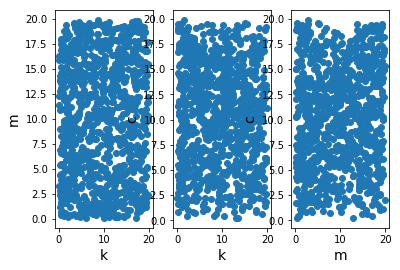

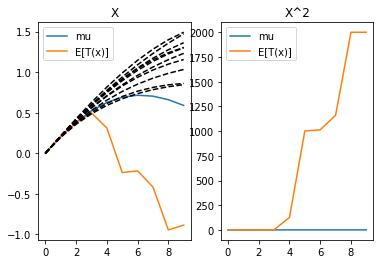

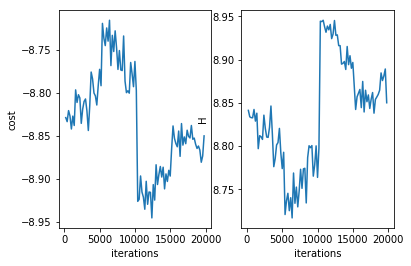

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 20000 
H 8.884980725972305
cost -8.881331807738254
system.D 3


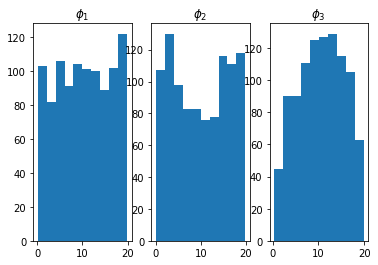

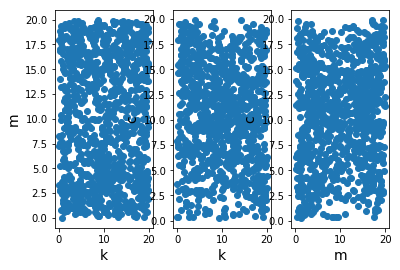

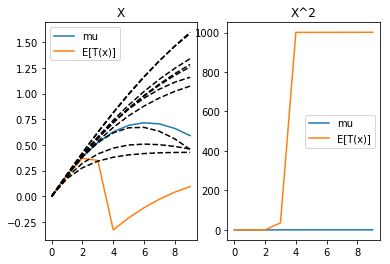

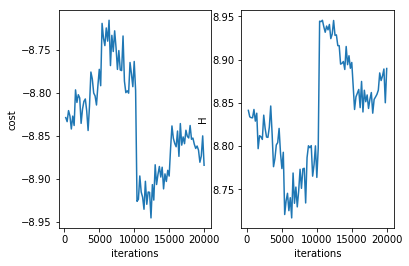

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
Doubling memory allocation for parameter logging.
saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/
AL iteration 3
resetting optimizer
aug lag it 2
lambda [ 0.00000000e+00 -1.31131795e-11 -5.62491937e-10 -1.04619033e-09
 -1.37688550e-09 -1.98438467e-09 -1.98044577e-09 -2.03428388e-09
 -2.30675103e-09 -2.28759977e-09 -5.00000000e-14  1.25361081e-10
  5.05126199e-07  1.00167304e-06  1.15655966e-06  2.00037790e-06
  2.00357263e-06  2.03852883e-06  2.42771495e-06  2.50060117e-06]
c 1.6e-09
saving model at iter 0
******************************************
it = 20200 
H 8.935713218756185
cost -8.844142322030995
system.D 3


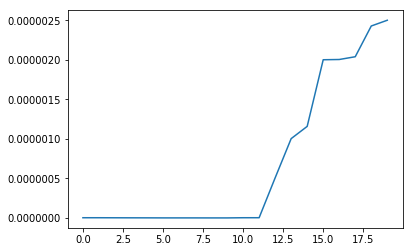

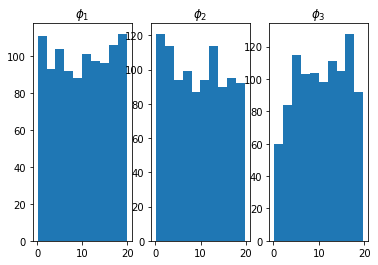

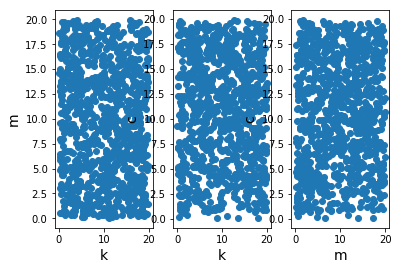

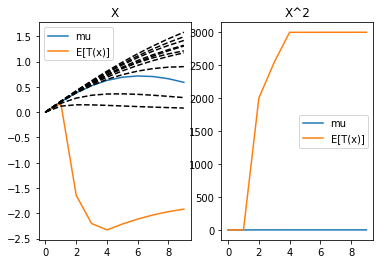

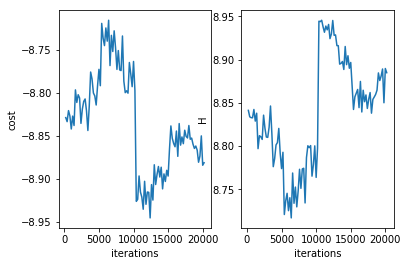

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 20400 
H 8.903354034696207
cost -8.903346225694586
system.D 3


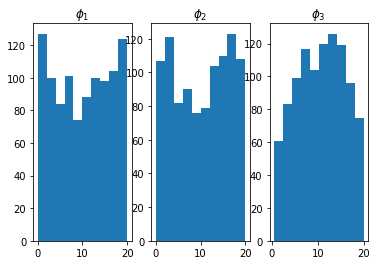

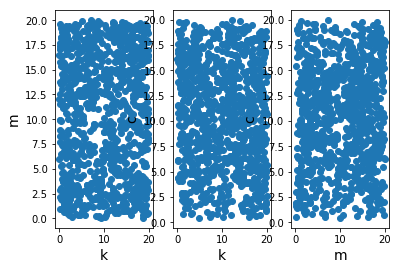

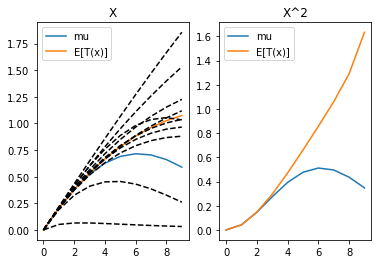

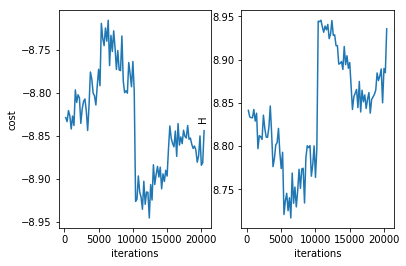

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 20600 
H 8.905555952054009
cost -8.791869539581779
system.D 3


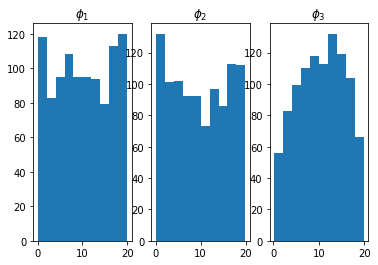

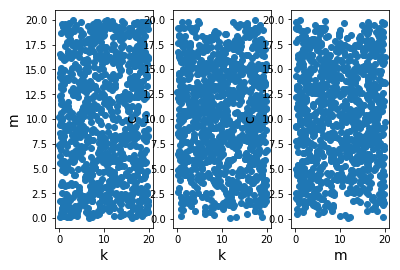

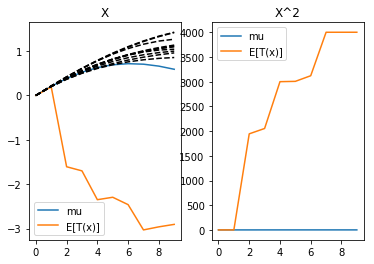

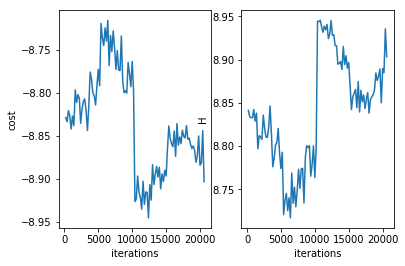

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 20800 
H 8.898926946460866
cost -8.874249033424489
system.D 3


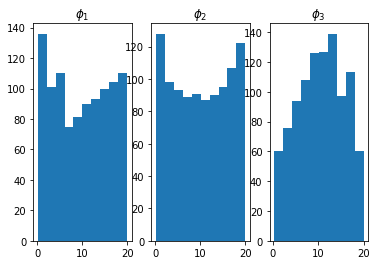

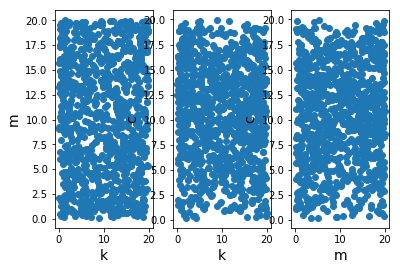

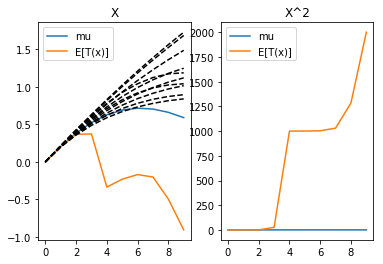

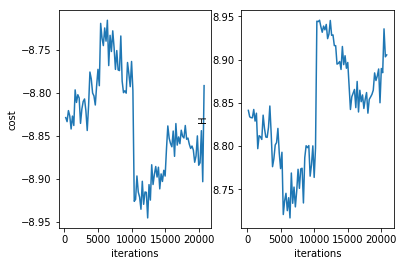

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 21000 
H 8.880858409686953
cost -8.880851162304609
system.D 3


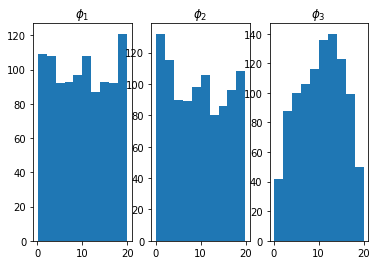

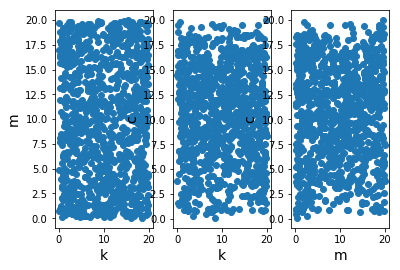

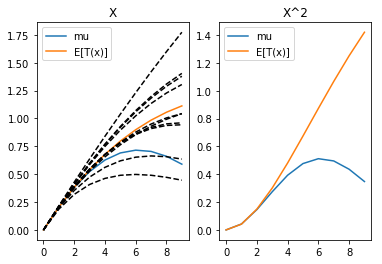

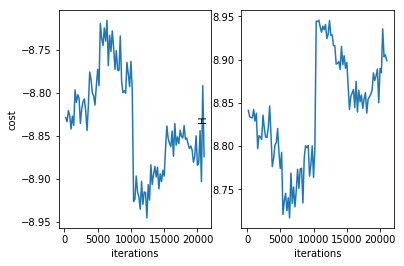

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 21200 
H 8.85224633939599
cost -8.85222137782775
system.D 3


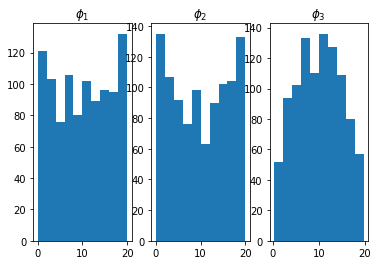

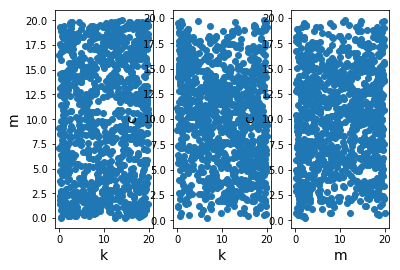

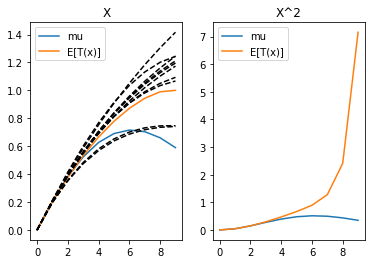

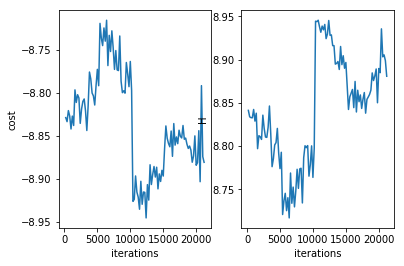

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 21400 
H 8.85108878985248
cost -8.831041367187757
system.D 3


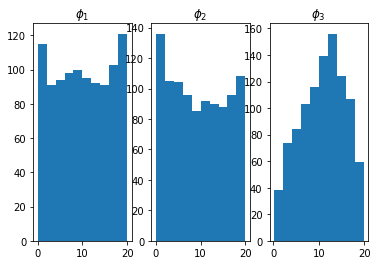

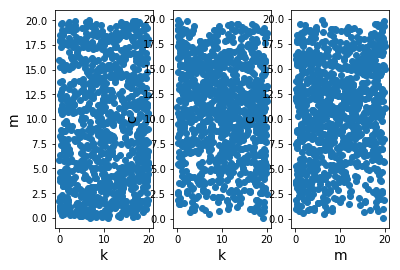

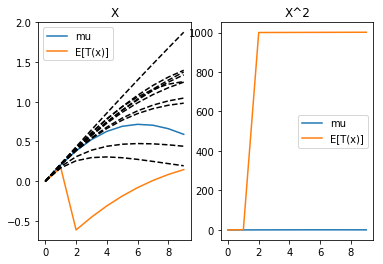

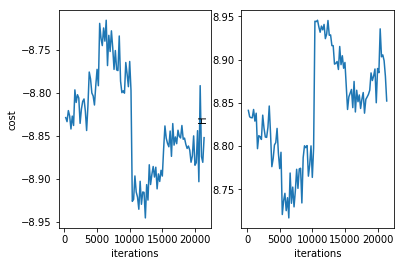

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 21600 
H 8.887631363310048
cost -8.86883847348342
system.D 3


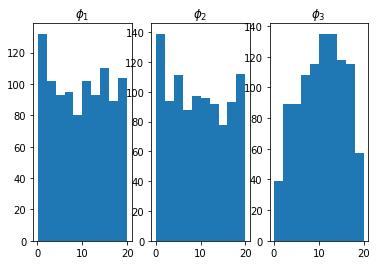

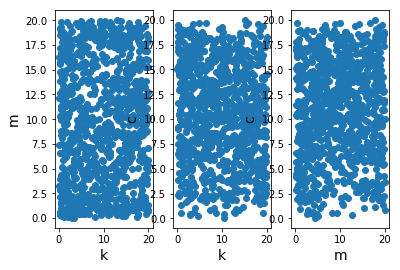

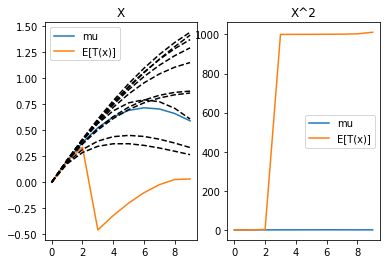

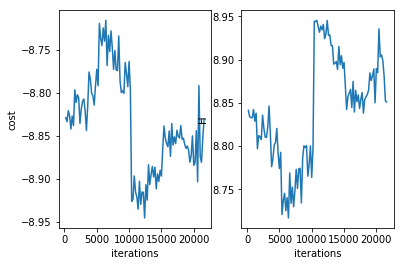

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 21800 
H 8.886398879115834
cost -8.868931585680931
system.D 3


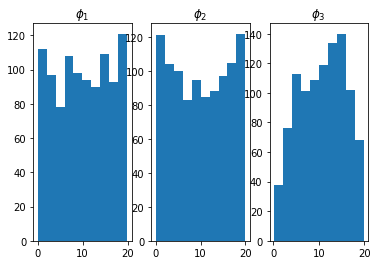

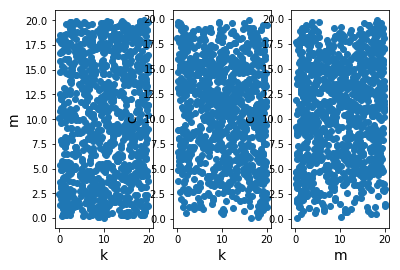

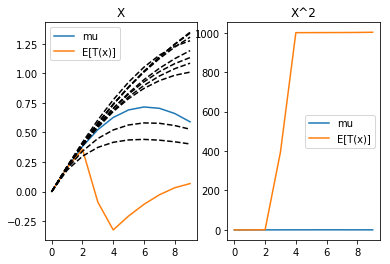

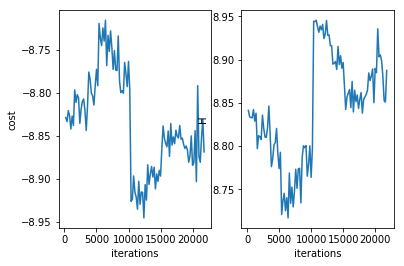

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 22000 
H 8.849185468706441
cost -8.83481941883379
system.D 3


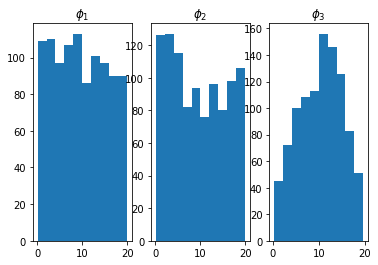

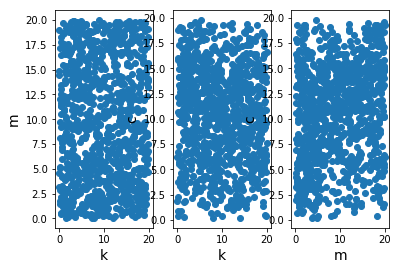

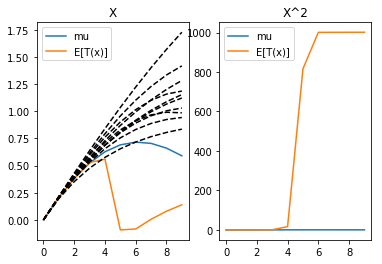

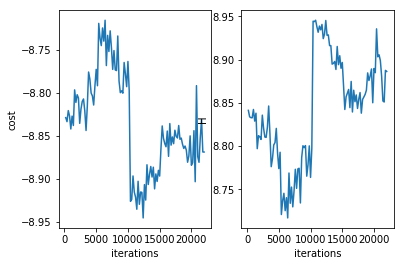

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 22200 
H 8.861273271873706
cost -8.841222594635685
system.D 3


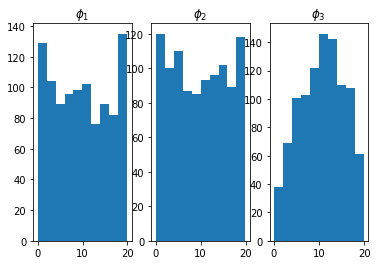

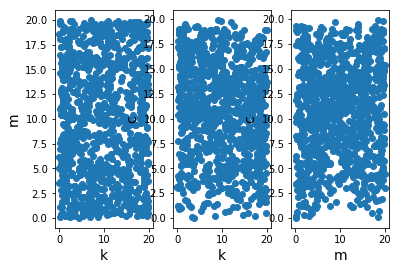

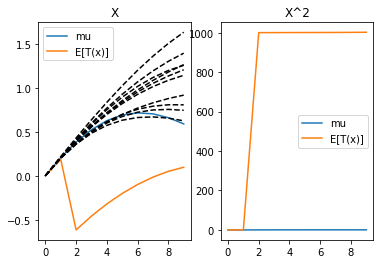

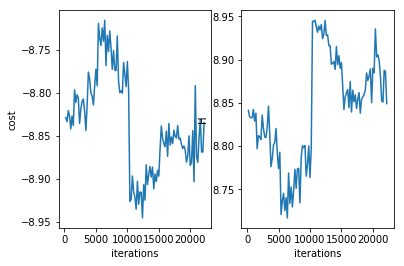

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 22400 
H 8.880526935445943
cost -8.860479926238373
system.D 3


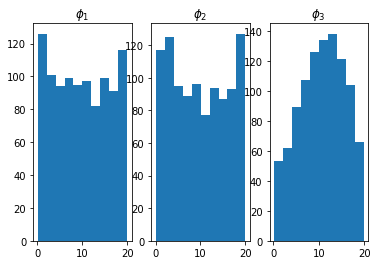

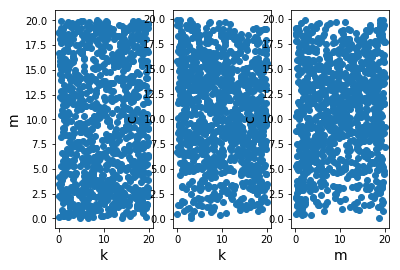

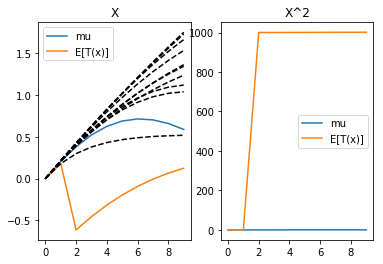

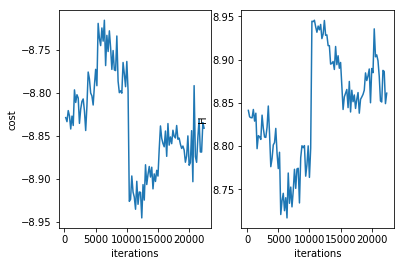

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 22600 
H 8.859009833945866
cost -8.85898511096064
system.D 3


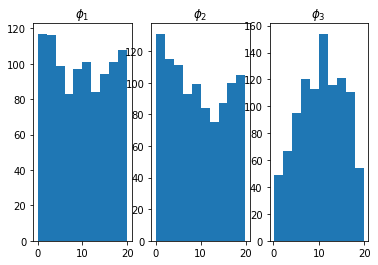

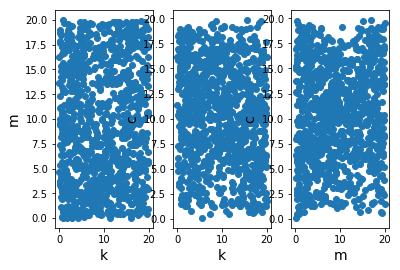

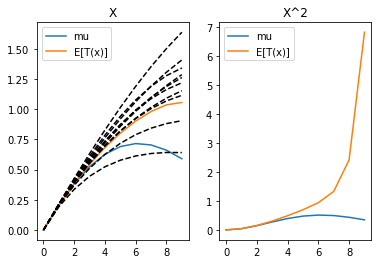

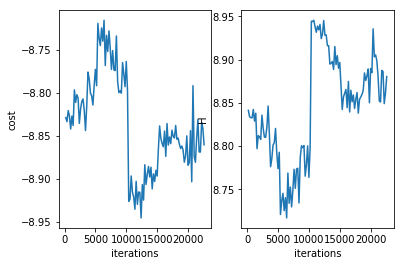

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 22800 
H 8.85089314858511
cost -8.832150626855304
system.D 3


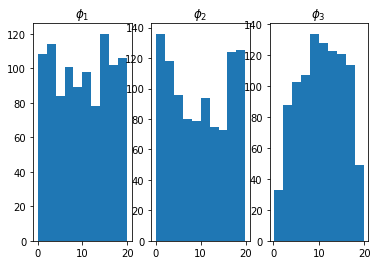

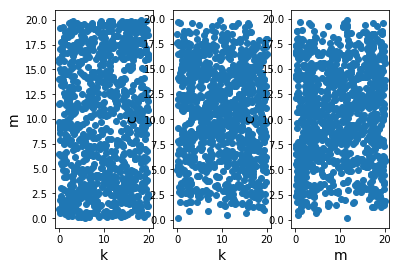

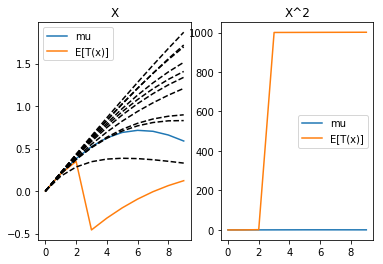

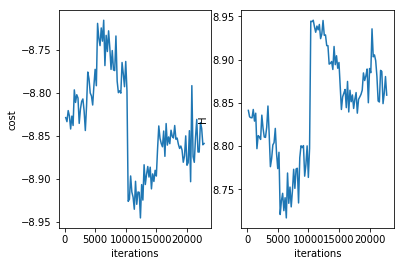

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 23000 
H 8.86287797939898
cost -8.799323241169244
system.D 3


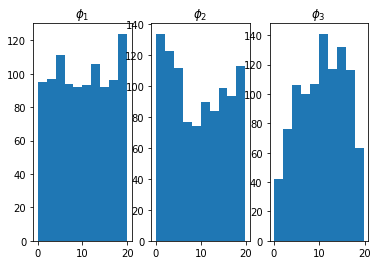

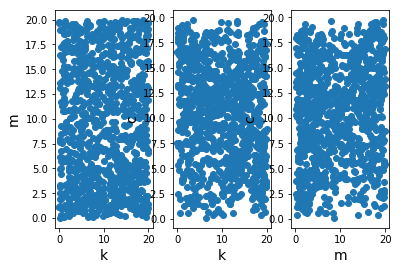

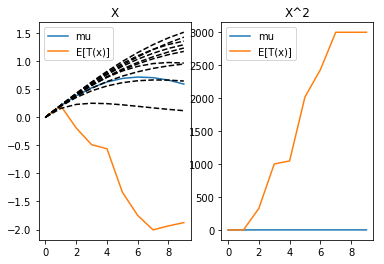

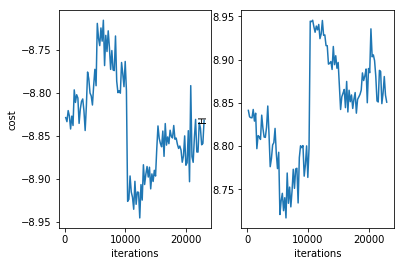

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 23200 
H 8.882043784853046
cost -8.866731129963936
system.D 3


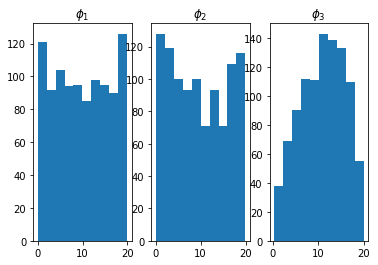

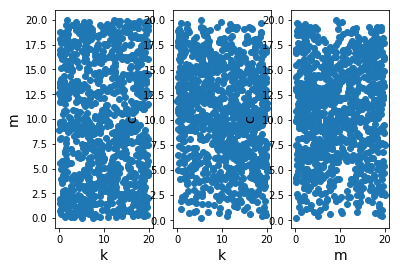

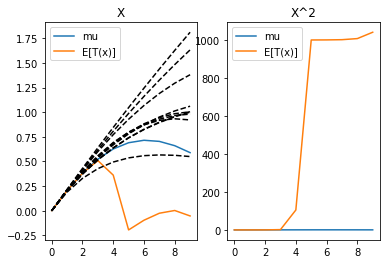

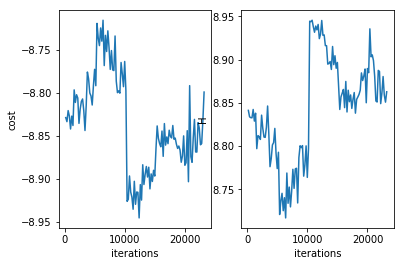

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 23400 
H 8.843066023099452
cost -8.82432259476263
system.D 3


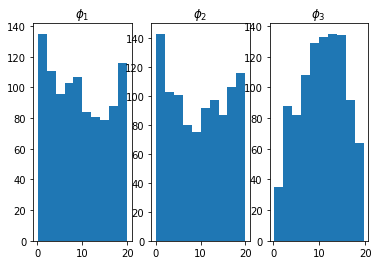

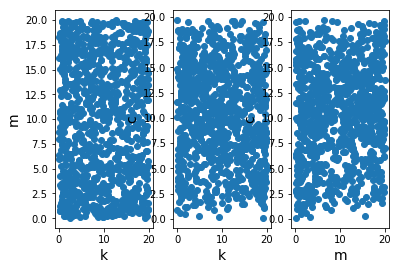

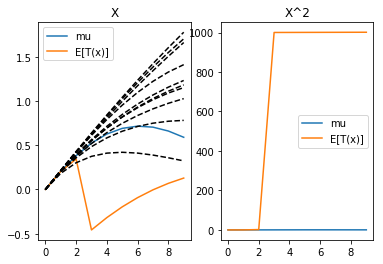

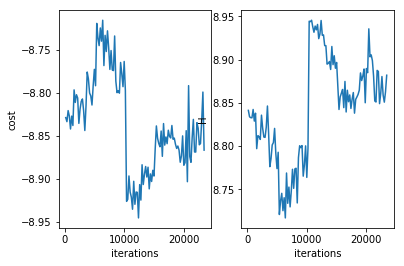

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 23600 
H 8.859823645638128
cost -8.859815483085297
system.D 3


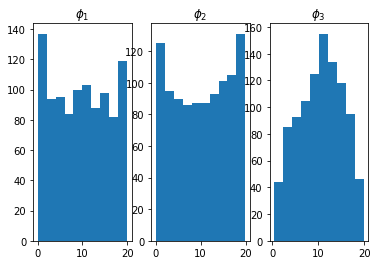

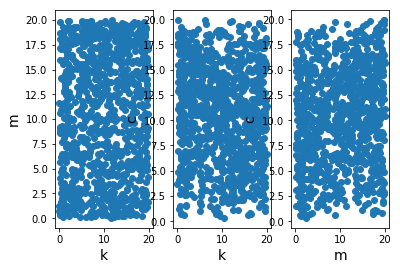

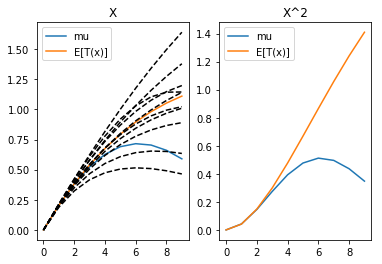

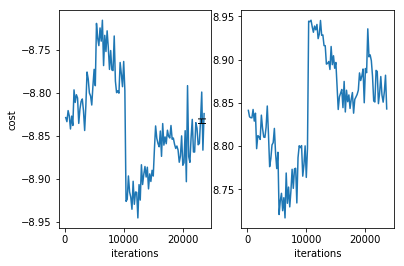

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 23800 
H 8.864454305443987
cost -8.847448149242497
system.D 3


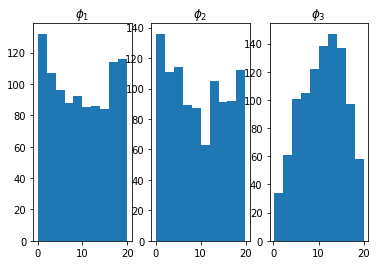

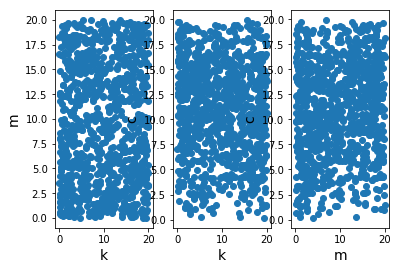

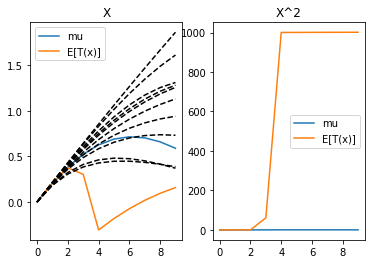

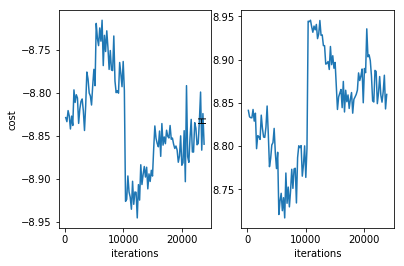

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 24000 
H 8.858603437711627
cost -8.838555651042482
system.D 3


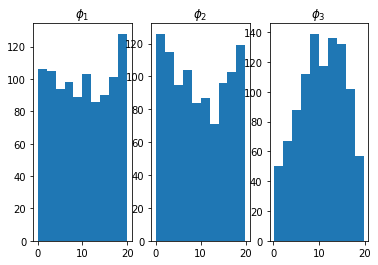

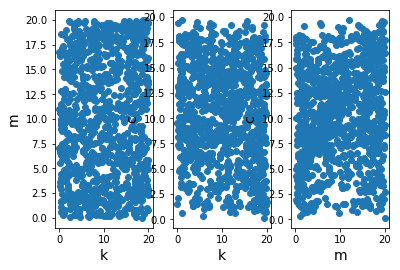

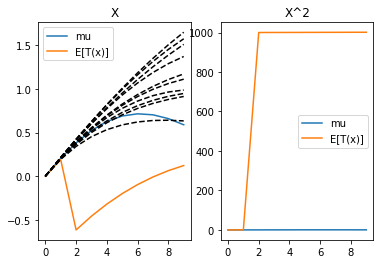

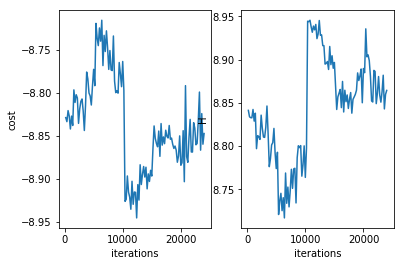

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 24200 
H 8.880954931458916
cost -8.880515476370826
system.D 3


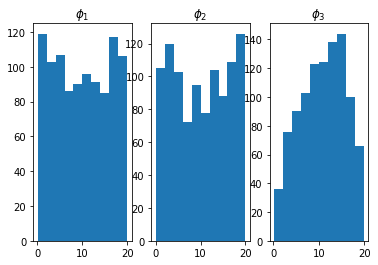

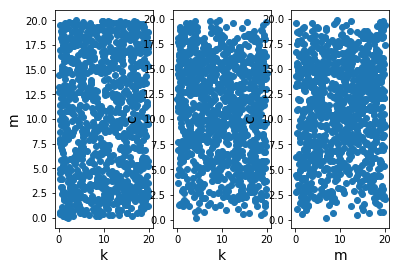

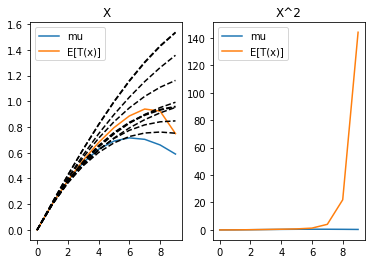

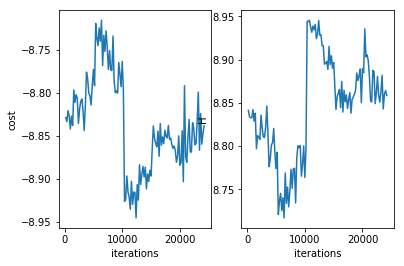

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 24400 
H 8.854738369599206
cost -8.837754889991244
system.D 3


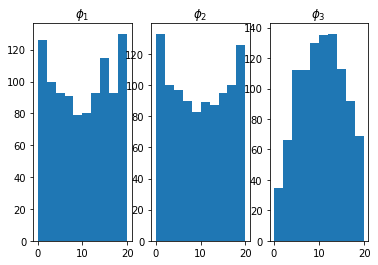

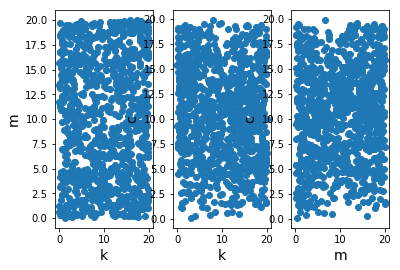

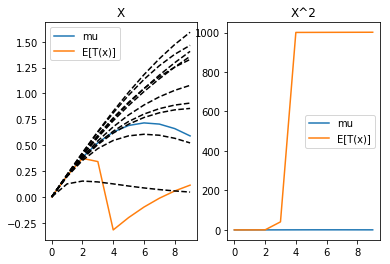

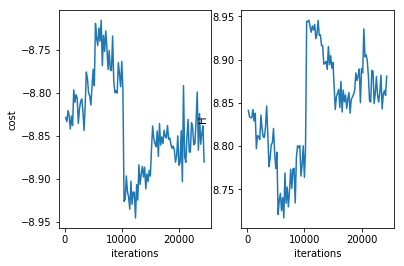

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 24600 
H 8.867711014422472
cost -8.867691080185216
system.D 3


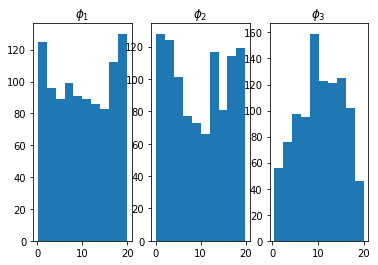

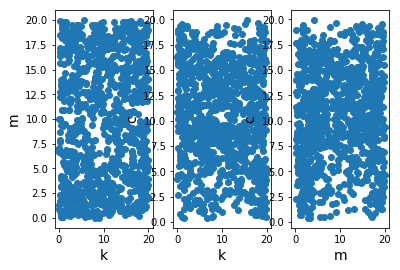

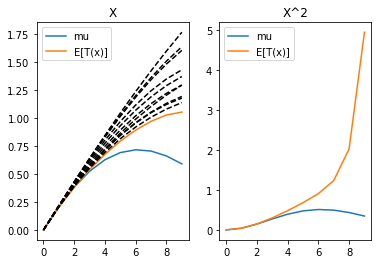

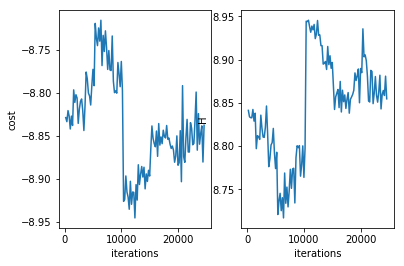

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 24800 
H 8.85712515356491
cost -8.781787401853938
system.D 3


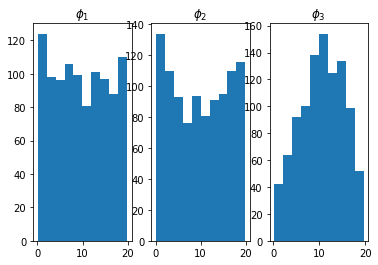

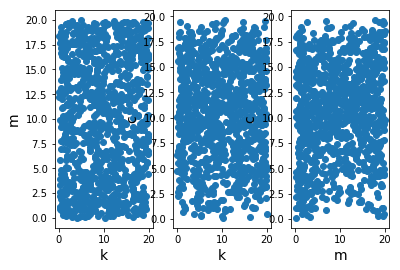

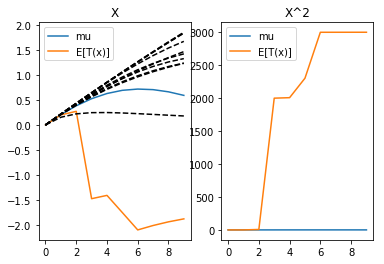

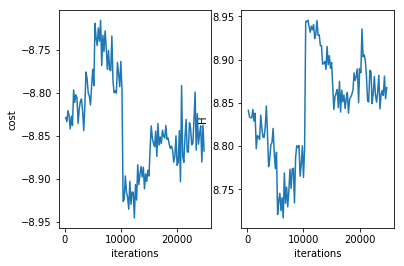

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 25000 
H 8.853756687076308
cost -8.840615579726071
system.D 3


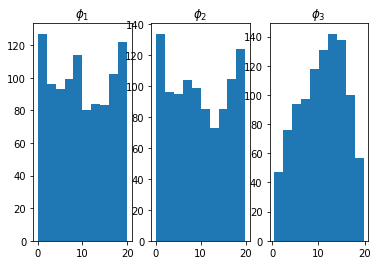

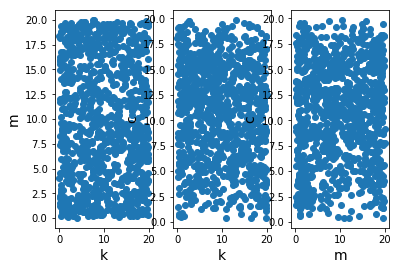

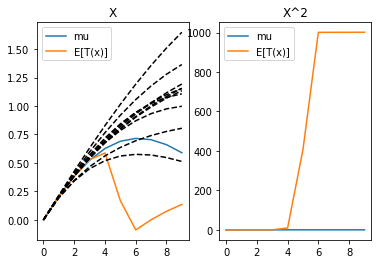

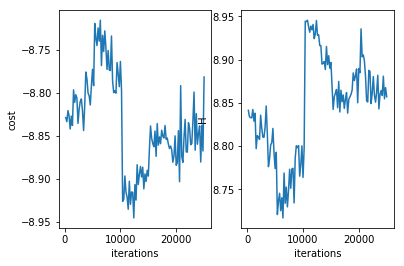

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 25200 
H 8.841693758782476
cost -8.832064730804227
system.D 3


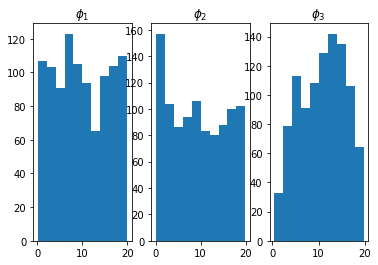

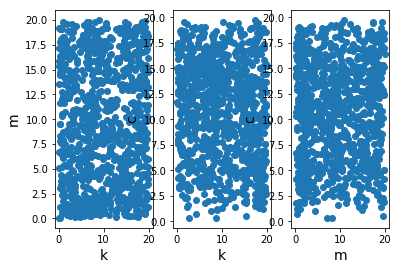

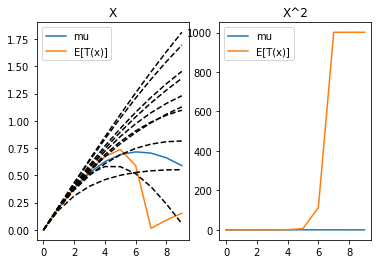

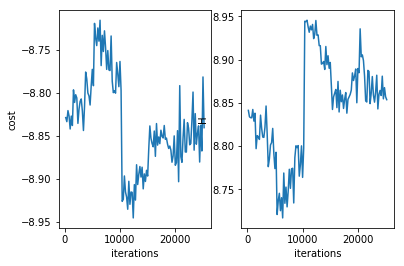

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 25400 
H 8.87389253480528
cost -8.856907711432173
system.D 3


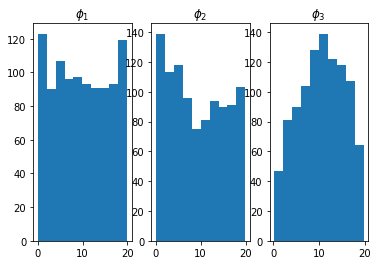

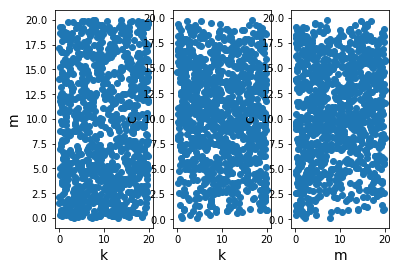

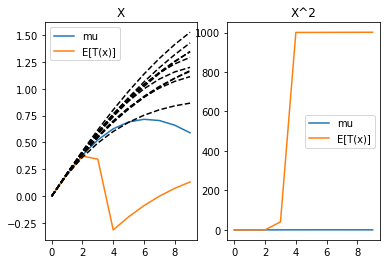

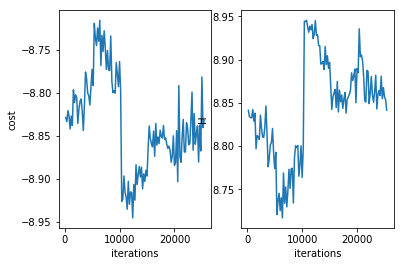

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 25600 
H 8.850173826107472
cost -8.850161321912562
system.D 3


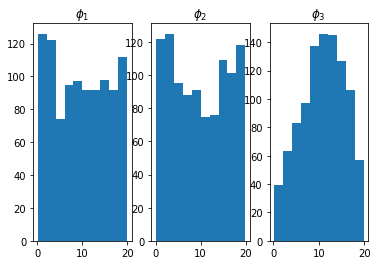

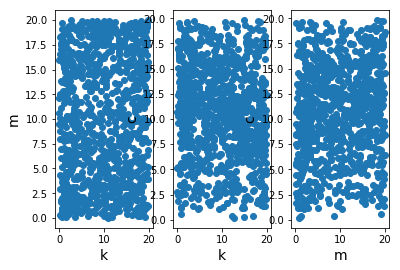

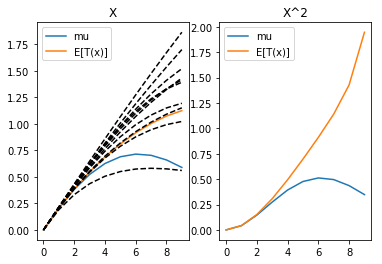

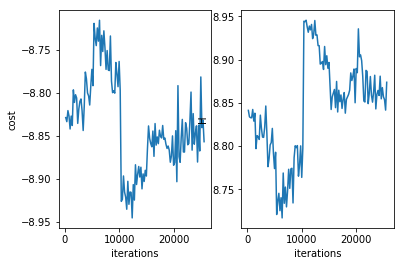

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 25800 
H 8.854507366398442
cost -8.85055348461614
system.D 3


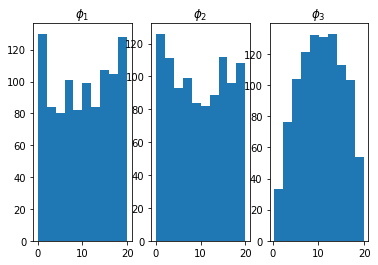

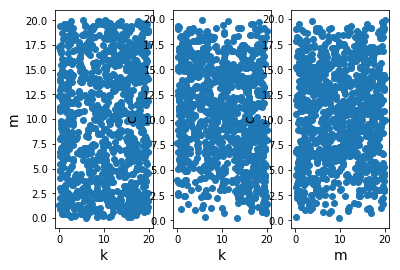

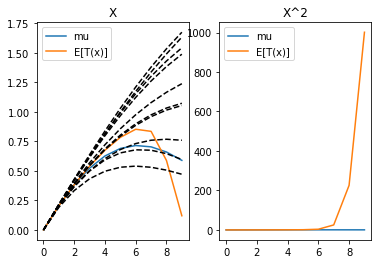

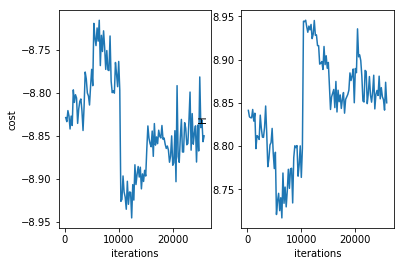

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 26000 
H 8.852682332100736
cost -8.832632633185096
system.D 3


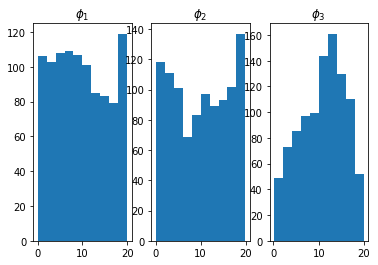

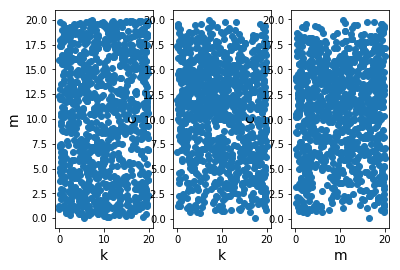

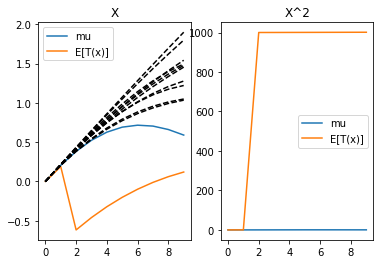

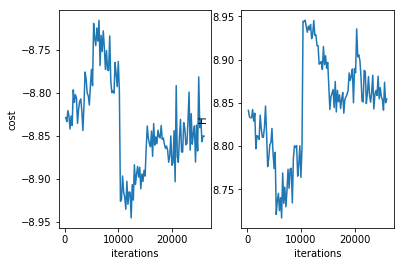

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 26200 
H 8.851931723015598
cost -8.851920689513205
system.D 3


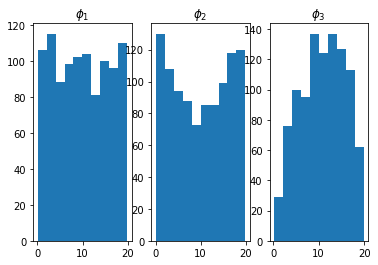

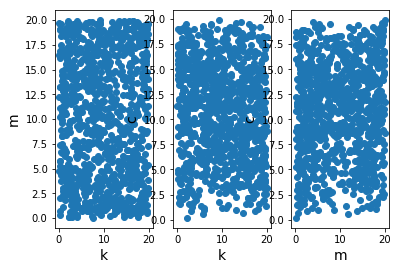

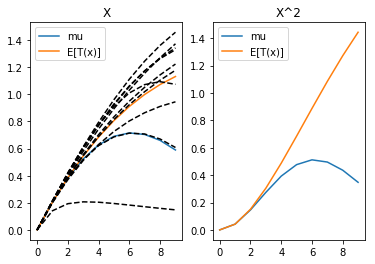

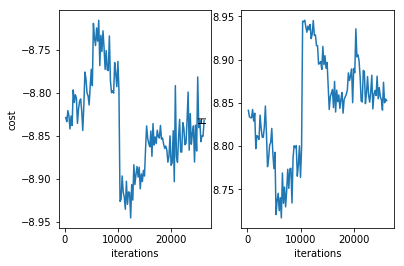

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 26400 
H 8.864184383561268
cost -8.864172912272947
system.D 3


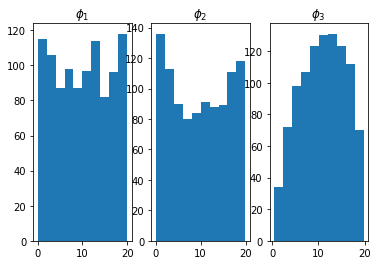

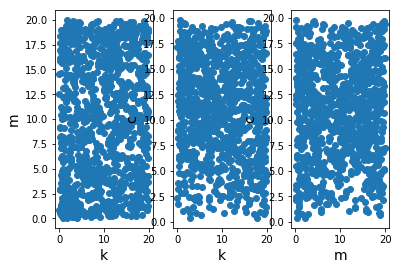

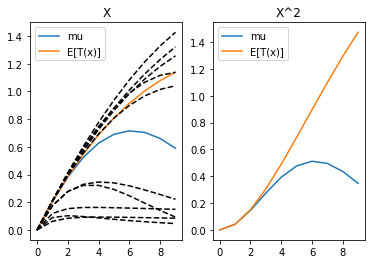

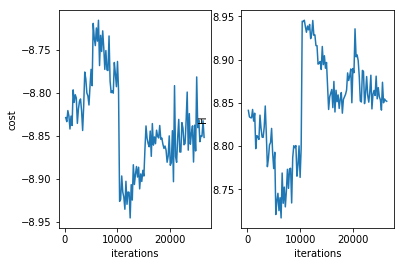

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 26600 
H 8.86748987904843
cost -8.86747925324488
system.D 3


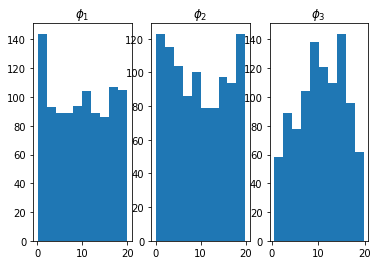

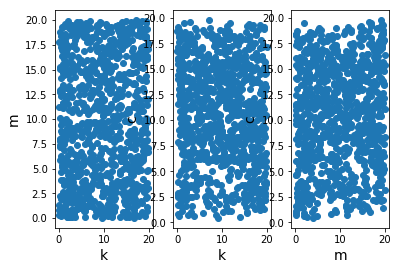

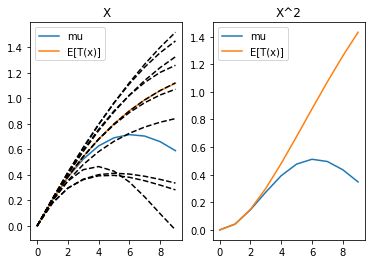

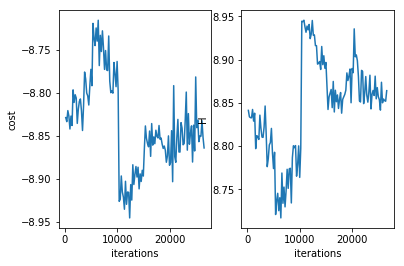

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 26800 
H 8.861100715605286
cost -8.814879360611439
system.D 3


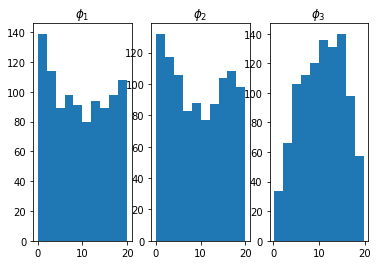

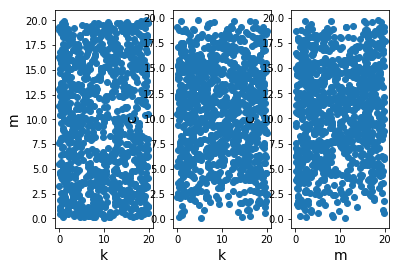

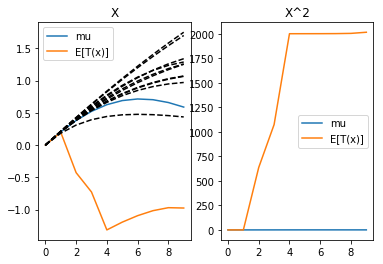

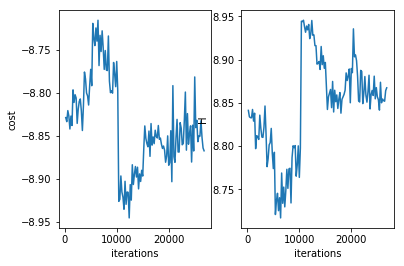

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 27000 
H 8.876115783064007
cost -8.876104930607287
system.D 3


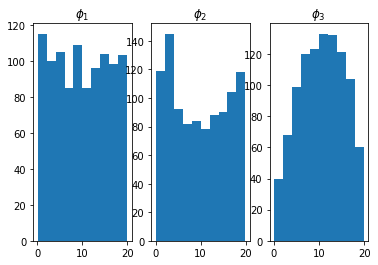

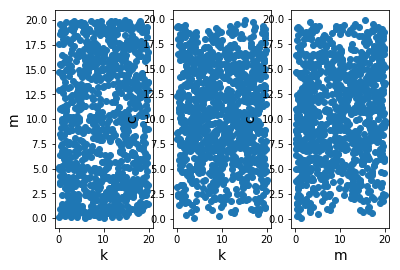

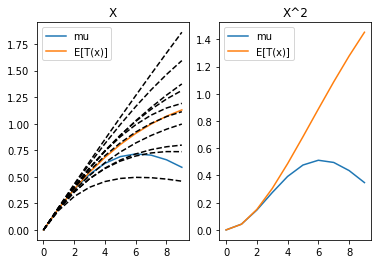

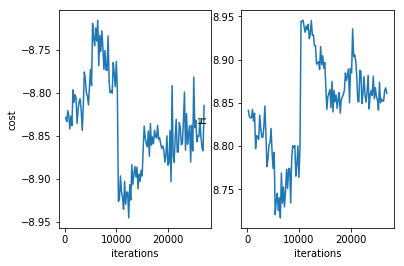

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 27200 
H 8.858821138401563
cost -8.858516556787876
system.D 3


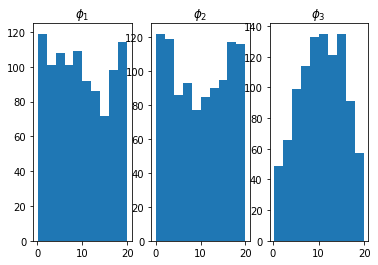

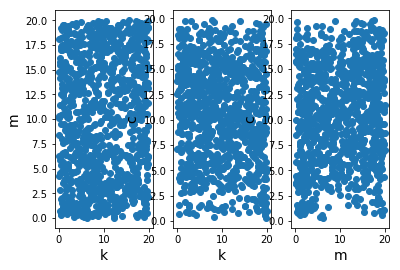

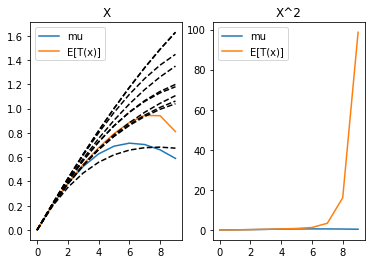

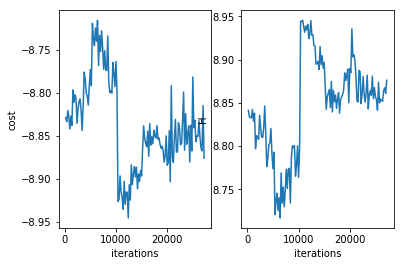

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 27400 
H 8.848246643101291
cost -8.833794772269163
system.D 3


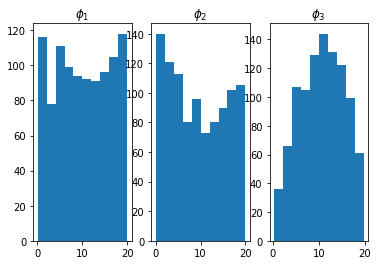

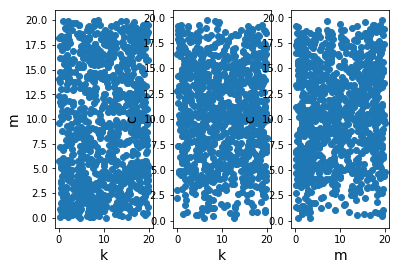

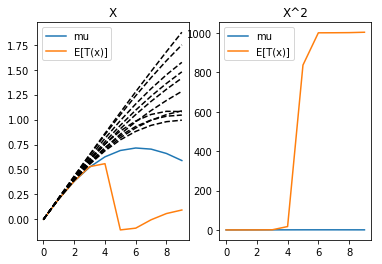

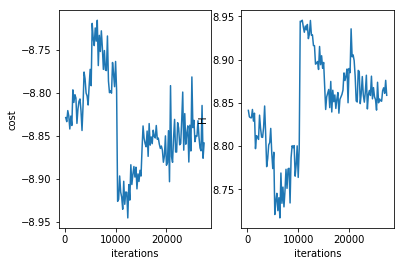

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 27600 
H 8.866094768969077
cost -8.816942768255252
system.D 3


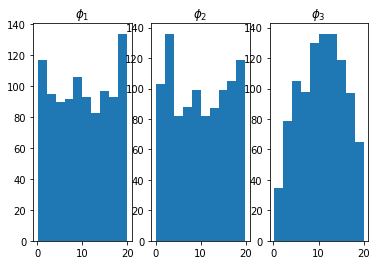

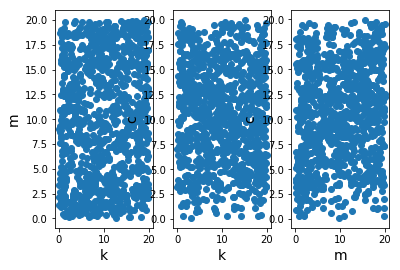

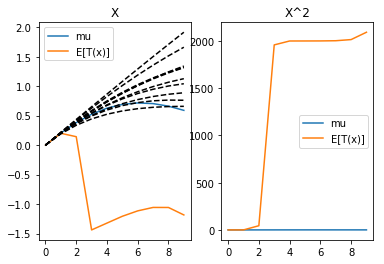

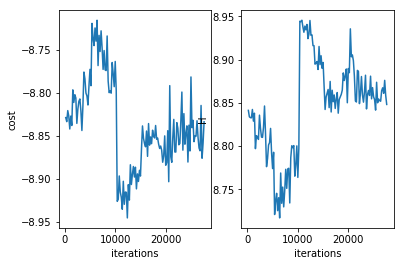

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************
******************************************
it = 27800 
H 8.885510341597236
cost -8.871946732191951
system.D 3


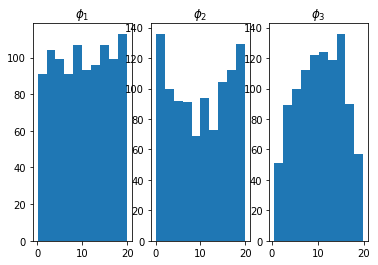

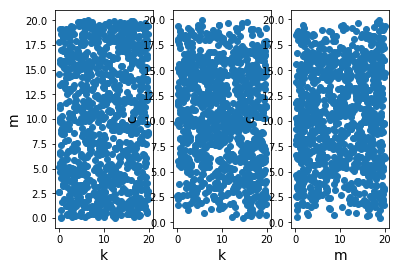

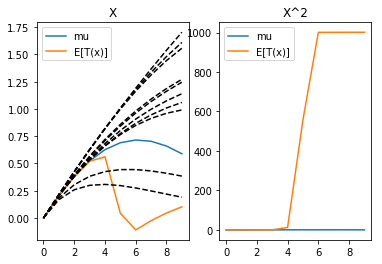

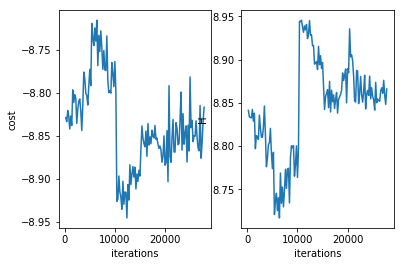

saving to results//tb/damped_harmonic_oscillator_D=3_T=10_flow=5P_lr_order=-3_c=-10_rs=0/  ...
******************************************


In [ ]:
behavior_str = 'trajectory';
random_seed = 0;

TIF_flow_type = 'PlanarFlowLayer';
nlayers = 5;
flow_dict = {'latent_dynamics':None, \
             'TIF_flow_type':TIF_flow_type, \
             'repeats':nlayers};

n = 1000;
k_max = 20;
c_init = 1e-10;
check_rate = 200;
max_iters = 10000;
lr_order = -3;


system_class = system_from_str(system_str);
system = system_class(behavior_str, T, dt, init_conds, bounds);

np.random.seed(0);

behavior = {'mu':mu, 'Sigma':Sigma};
print(behavior)
print(init_conds)

cost, phi, T_x = train_dsn(system, behavior, n, flow_dict, \
                       k_max=k_max, c_init=c_init, lr_order=lr_order, check_rate=check_rate, \
                       max_iters=max_iters, random_seed=random_seed);



In [25]:
print(t.shape)

(50,)
